# Cross_species Low dimensional multinomial logistic regression label transfer of variance decomposed Single Cell Data

## Author Notes

* The following tutorial describes a method for integrating data by label transfering based on ridge regulariased logistic regression in low-dimensional space. This approach enables us to fit a model on the annotated training/landscape/reference dataset to predict labels of a new dataset and embed these labels onto neighbourhoods in the prediction data. 

* Logistic regression can (1) be used to classify samples, (2) use different types of data (continuous and descrete measurements)and (3) also be used to assess what variables are useful for classifying samples.

#### Current progress: 
- integrating a latent variable model for neighbourhood construction using factor decomposition. 
- Integration of BIC metric
- Integration of Robustness testing
#### Testing required: 
- Robustness of runs need to be tested by permutation of dependent variables and similairty of outcome tested using MI, RAND or BIC

# Add a few things here:
- Scale each dataset independently
- Oversample rare populations perhaps use SMOTE (Synthetic Minority Oversampling Technique)
- model prediction power
- manual feature selection for features of each training label
- Create a pseudobulk of human data for training

# Basic processing of PCA post highly variable gene calculation is very prone to bad classification due to class imabalance. 

- Genes are ranked by the normalized variance, thus minority classes do not contrbute sufficient gene variance
- SMOTE enables creation of simulated minority classes whilst optionally undersampling majority classes. 
- Improves the feature selection done by variance and thus the PCA output. 

# Model pipeline
- Training data which has descrete and well-defined classes 
- A concatenated dataset (cellsxgenes) is constructed comprised of independently scaled data of each species origin respectively.
-

# Integration options:
- HARMONY
- SCVI
- SAMAP (https://elifesciences.org/articles/66747)

# PCA reconstruction from SMOTE
- https://towardsdatascience.com/dimensionality-reduction-with-pca-from-basic-ideas-to-full-derivation-37921e13cae7
-Now in the subspace U we can store only one value for each data point — a corresponding coordinate λ in the subspace U. These coordinates in lower dimension are called code. Using these coordinates λ and a basis vector b we can reconstruct data back to the original dimension,the result is called reconstruction.
You can mention here that reconstructed data differs from the original one, we can measure that difference as Euclidean distance between the original and reconstructed points. As we can see dimensionality reduction comes at a certain cost, the price we have to pay is information loss. But still it has some sense: even with such a random projection, reconstructed data reflects some of the original data properties: we still can see that X and Y are positively correlated, and even the slope of the reconstructed data is quite close to the original.

# Author information

### Created on: 291020; Updated: 050621;
### Author: Issac Goh
### Proof readers/Testers: 

In [1]:
import sys
import subprocess

#import pkg_resources
#required = {'harmonypy','sklearn','scanpy','pandas', 'numpy', 'bbknn', 'scipy', 'matplotlib', 'seaborn' ,'scipy'}
#installed = {pkg.key for pkg in pkg_resources.working_set}
#missing = required - installed
#if missing:
#    print("Installing missing packages:" )
#    print(missing)
#    python = sys.executable
#    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from geosketch import gs
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
from pathlib import Path

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=150, color_map='viridis')

# Only block to edit in LR script

#### Run in this order: 
- bio-mart (requires mouse ensdb gene ids)
- build_mouse
- Blast_samap
- human_mouse_comp

# Update:
- Because using ENST maps with SAMAP, read in data which contains more than just homologs from each species. 
- SAMAP blast is only computed between the highly variable genes of each dataset, this can be an issue with differetial expression testing, but can account for that later

In [2]:
# Introduce variables
# Note that this script expects raw data to be in "non-batch-corrected" adata.raw.X. 

# Required: Introduce the path you'd like to save figures or data to 
save_path = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/"

# Required: Name of second object
data2 = "_mouse_gastrulation"
# Provide path to obj2 // prediction/projection data
#Object2 = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/mouse_gastrulation_data/A1_V1_mouse_data_built_250521.h5ad"
Object2 = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/mouse_gastrulation_data/mouse_data_built_261021_raw_enst.h5ad'
# Provide categorical to join between datasets
cat2 = "celltype"

# Required: Name of second object
#data1 = "_ys_fliv"
data1 = "_ys"
# Provide path to obj2 // prediction/projection data
#Object1 = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/A4_V7_Combined_YS_Fliver_20210914.h5ad"
#Object1 = "/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/A4_V6_YS_integrated_data_singlets_with_raw_counts_for_MS_plotting_20210914_with_obsp.h5ad"
Object1 = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/A4_V6_YS_integrated_data_singlets_with_raw_counts_for_MS_plotting_20210914_with_obsp_pr.h5ad'
# Provide categorical to join between datasets
cat1 = 'cell.labels'

# Required: LR Model Options
penalty='elasticnet' # can be ["l1","l2","elasticnet"]
#penalty='l2'
sparcity=0.1
max_iter = 200 #Increase if experiencing max iter issues
l1_ratio = 0.5 #If using elasticnet, tis controls the ratio between l1 and l2

# Optional: Batch correction options (this is for correction of eventual combined dataset for data1 and data2)
# If you do not have a batch variable for either data1 or data2, please add a "filler" column in the relevent adata.obs
# for the purposes of batch_correction and batch args below.
# e.g., adata.obs["whatever"] = "something"; batch="whatever"
batch_correction = "Harmony" # Will accept Harmony, BBKNN or False as options
batch = ["species_donor","species",] # Will accept any batch categorical. Comma space a batch categorical for each dataset. Position 1 is for data1, position 2 is for data2
theta = 5

# Optional: miscellaneous Options.   
subsample_train = False # Samples the training data to the smallest fraction (highly dependent on resolution of input celltype categorical). This corrects for proportional differences between celltype labels of interest in the training data. E.g., training data has 50,000 B cells, 20,000 T cells and 100 HSCs. This function will subsample all training to 100 cells per cell type. 
subsample_prop = 0.2 # Give this option a proprtion to subsample to(e.g 0.2), if NA given, will subsample to smallest population
subsample_predict = True
subsample_prop_predict = 0.5
remove_non_high_var = True

train_x = 'X_pca' # Define the resource to train and predict on, PCA, X or UMAP (#if you wish to use gene expression, train_x = 'X')
remove_effect_of_custom_gene_list = 'NA' # "./cell_cycle_genes.csv" #remove a custom list of genes from just the variable genes to compute PCA from. Your .csv should have HGNC gene names in the first column to be read in as a vector, any column name is fine.
use_raw = False # Do you want to use adata.raw.X (recommended)

In [3]:
%%time
# Check if filepaths are good
if not os.path.exists(save_path):
    os.makedirs(save_path)
    
if (Path(Object1).is_file() & Path(Object2).is_file()):
    print("adata file paths detetcted, proceeding to load")
    adata = sc.read(Object1)
    adata2 =  sc.read(Object2)
    del adata.uns
    del adata2.uns
else: 
    raise TypeError("one or more .h5ad paths cannot be accessed")

adata file paths detetcted, proceeding to load
CPU times: user 2.21 s, sys: 3.44 s, total: 5.65 s
Wall time: 5.66 s


# Get Human and mouse ENST mappings
- Run "Biomart script" before hand with same data

In [4]:
# Human
h_ensembl = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/human_transcript_data.csv',index_col = 0)
h_genes = adata.var
h_names = h_ensembl[h_ensembl.hgnc_symbol.isin(adata.var.index)]
#h_names = [(y,x) for x in h_genes.index for y in h_ensembl.loc[h_ensembl["external_gene_name"]==x,"ensembl_transcript_id_version"] ]\

In [5]:
h_names

,hgnc_symbol,ensembl_transcript_id_version,ensembl_gene_id,external_transcript_name,external_gene_name
1,ADI1,ENST00000627048.1,ENSG00000280830,ADI1-204,ADI1
2,ADAMTS12,ENST00000625675.1,ENSG00000281690,ADAMTS12-207,ADAMTS12
3,ADAMTS12,ENST00000627759.1,ENSG00000281690,ADAMTS12-208,ADAMTS12
4,ADAMTS12,ENST00000630537.2,ENSG00000281690,ADAMTS12-210,ADAMTS12
5,ADAMTS12,ENST00000630002.1,ENSG00000281690,ADAMTS12-209,ADAMTS12
...,...,...,...,...,...
184164,STK40,ENST00000373132.4,ENSG00000196182,STK40-204,STK40
184165,STK40,ENST00000460417.5,ENSG00000196182,STK40-206,STK40
184166,STK40,ENST00000473733.5,ENSG00000196182,STK40-207,STK40
184167,STK40,ENST00000482458.1,ENSG00000196182,STK40-208,STK40


In [6]:
# Use first splice varaint for each
h_names = h_names.groupby('hgnc_symbol').head(1)
mapper = dict(zip(list(h_names['hgnc_symbol']),list(h_names['ensembl_transcript_id_version'])))
adata.var['ets'] = adata.var.index.values
adata.var['ets'] = adata.var['ets'].map(mapper)
adata.var['ets']

A1BG            ENST00000596924.1
A1BG-AS1        ENST00000594950.5
A1CF            ENST00000374001.6
A2M             ENST00000543436.2
A2M-AS1         ENST00000667950.1
                      ...        
ZYX             ENST00000647126.1
ZZEF1           ENST00000381638.7
ZZZ3            ENST00000481346.5
bP-21264C1.2                  NaN
bP-2189O9.3                   NaN
Name: ets, Length: 30330, dtype: object

In [7]:
# Mouse
m_ensembl = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/mouse_transcript_data.csv',index_col = 0)
m_genes = adata2.var
#m_names = m_ensembl[m_ensembl.ensembl_gene_id.isin(adata2.var['ENSDB'])]
#h_names = [(y,x) for x in h_genes.index for y in h_ensembl.loc[h_ensembl["external_gene_name"]==x,"ensembl_transcript_id_version"] ]\
m_names = m_ensembl

In [8]:
adata2.var

,HGNC,mouse_human_homologs,DB Class Key_homogene_db,Common Organism Name_homogene_db,NCBI Taxon ID_homogene_db,Symbol_homogene_db,EntrezGene ID_homogene_db,Mouse MGI ID_homogene_db,HGNC ID_homogene_db,OMIM Gene ID_homogene_db,Genetic Location_homogene_db,"Genomic Coordinates (mouse: , human: )_homogene_db",Nucleotide RefSeq IDs_homogene_db,Protein RefSeq IDs_homogene_db,SWISS_PROT IDs_homogene_db,ets
index,,,,,,,,,,,,,,,,
ENSMUSG00000051951,Xkr4,ENSMUSG00000051951,39520667.0,"mouse, laboratory",10090.0,Xkr4,497097.0,MGI:3528744,NaN,NaN,Chr1 1.6 cM,Chr1:3276124-3741721(-),"NM_001011874,XM_011238395,XM_036152287,XM_0064...","XP_011236697,NP_001011874,XP_036008180,XP_0064...",Q5GH67,ENSMUST00000070533.5
ENSMUSG00000089699,Gm1992,ENSMUSG00000089699,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000161581.2
ENSMUSG00000102343,Gm37381,ENSMUSG00000102343,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000192427.2
ENSMUSG00000025900,Rp1,ENSMUSG00000025900,39520074.0,"mouse, laboratory",10090.0,Rp1,19888.0,MGI:1341105,NaN,NaN,Chr1 1.65 cM,Chr1:4185896-4479489(-),"NM_001370921,NM_001195662,NM_011283,XM_030252325","NP_035413,XP_030108185,NP_001357850,NP_001182591",P56716,ENSMUST00000027032.6
ENSMUSG00000025902,Sox17,ENSMUSG00000025902,39501994.0,"mouse, laboratory",10090.0,Sox17,20671.0,MGI:107543,NaN,NaN,Chr1 1.65 cM,Chr1:4561154-4567577(-),"NM_001289466,NM_001289465,NM_011441,XM_0302524...","NP_001276394,NP_001276396,XP_030108265,NP_0012...",Q61473,ENSMUST00000192913.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000079808,AC168977.1,ENSMUSG00000079808,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000115924.3
ENSMUSG00000095041,AC149090.1,ENSMUSG00000095041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000178343.2
ENSMUSG00000063897,DHRSX,ENSMUSG00000063897,39505717.0,human,9606.0,DHRSX,207063.0,NaN,HGNC:18399,OMIM:301034,ChrXY p22.33 and Yp11.2,NaN,NM_145177,NP_660160,Q8N5I4,NaN


In [9]:
# Check mapping
unique_m_trans = m_names.groupby('ensembl_gene_id').head(1)
unique_m_trans[unique_m_trans['ensembl_gene_id'].isin(adata2.var['mouse_human_homologs'])]
var = adata2.var
var['test'] = var.index.values
len(var['test'][var['test'].isin(['nan'])])

0

In [10]:
adata2.var['ets']

index
ENSMUSG00000051951    ENSMUST00000070533.5
ENSMUSG00000089699    ENSMUST00000161581.2
ENSMUSG00000102343    ENSMUST00000192427.2
ENSMUSG00000025900    ENSMUST00000027032.6
ENSMUSG00000025902    ENSMUST00000192913.2
                              ...         
ENSMUSG00000079808    ENSMUST00000115924.3
ENSMUSG00000095041    ENSMUST00000178343.2
ENSMUSG00000063897                     NaN
ENSMUSG00000096730                     NaN
ENSMUSG00000095742    ENSMUST00000179436.2
Name: ets, Length: 29452, dtype: category
Categories (28989, object): ['ENSMUST00000000001.5', 'ENSMUST00000000095.7', 'ENSMUST00000000096.12', 'ENSMUST00000000122.7', ..., 'ENSMUST00000239526.1', 'ENSMUST00020182545.1', 'ENSMUST00020183200.1', 'ENSMUST00020183771.1']

# Assign data unique metadata

In [11]:
adata.obs["species"] = 'Human'
#adata.obs["species_donor"] = adata.obs["species"].astype('str') + '_' + adata.obs["tissue_fetal_id"].astype('str')
adata.obs["species_donor"] = adata.obs["species"].astype('str') + '_' + adata.obs["fetal.ids"].astype('str')
adata2.obs["species"] = 'Mouse'
adata2.obs["species_donor"] = adata2.obs["species"].astype('str') + '_' + adata2.obs["sample"].astype('str')
adata2.var_names_make_unique()
adata2.raw = adata2
#adata.obs['tissue_cell.labels']  = adata.obs['cell.labels'].astype(str) + "_" + adata.obs['tissue'].astype(str)

# Assign cellstates to keep from human & mouse data

In [12]:
keep = [
 'MEMP_ys',
 'HSPC_1_ys',
 'Endoderm_ys',
 'Lymphoid_progenitor_ys',
 'Mesothelium_ys',
 'Fibroblast_ys',
 'HSPC_2_ys',
 'MOP_ys',
 'CMP_ys',
 'HE_ys',
 'LMPP_ys',
 'HSC/MPP_fliv',
 'Hepatocyte_fliv',
 'MEMP_fliv',
 'Lymphoid progenitor_fliv',
 'Fibroblast_fliv',]


keep = [
 'MEMP_ys',
 'HSPC_1_ys',
 'Endoderm_ys',
 'Lymphoid_progenitor_ys',
 'Mesothelium_ys',
 'Fibroblast_ys',
 'HSPC_2_ys',
 'MOP_ys',
 'CMP_ys',
 'HE_ys',
 'LMPP_ys',]

#adata = adata[adata.obs['tissue_cell.labels'].isin(keep)]
#adata = adata[adata.obs['cell.labels'].isin(keep)]
list(adata.obs[cat1].unique())

['Sinusoidal_EC',
 'MEMP',
 'HSPC_1',
 'Erythroid',
 'Endoderm',
 'Immature_EC',
 'Macrophage',
 'MK',
 'Early_Erythroid',
 'Lymphoid_progenitor',
 'Mesothelium',
 'Prolif_Sinusoidal_EC',
 'Fibroblast',
 'HSPC_2',
 'AEC',
 'Mast_cell',
 'MOP',
 'DC2',
 'CMP',
 'DC_precursor',
 'HE',
 'Monocyte',
 'LMPP',
 'Neutrophil_precursor',
 'Microglia',
 'Smooth_Muscle',
 'Promonocyte',
 'Eo_Baso_Mast_precursor',
 'ILC_precursor',
 'Pre_Macrophage',
 'VWF_EC',
 'Eo_Basophil',
 'Prolif_AEC',
 'NK',
 'Monocyte_Macrophage']

In [13]:
#keep = ['Primitive Streak','ExE ectoderm','ExE endoderm','Blood progenitors 2','ExE mesoderm', 'Haematoendothelial progenitors',
# 'Blood progenitors 1','Epiblast','Visceral endoderm']
#keep = ['ExE ectoderm','ExE endoderm','ExE mesoderm','Visceral endoderm','Haematoendothelial progenitors','Blood progenitors 1','Blood progenitors 2','Erythroid2','Erythroid3','Erythroid1','Endothelium']
keep = ['ExE endoderm','ExE mesoderm','Visceral endoderm','Haematoendothelial progenitors','Blood progenitors 1','Blood progenitors 2','Erythroid2','Erythroid3','Erythroid1']
adata2 = adata2[adata2.obs[cat2].isin(keep)]
adata2 = adata2[~adata2.obs[cat2].isin(['nan'])]

#keep = ['ExE ectoderm','ExE endoderm','ExE mesoderm']
adata2 = adata2[adata2.obs['celltype'].isin(keep)]
list(adata2.obs['celltype'].unique())

['Visceral endoderm',
 'ExE endoderm',
 'Blood progenitors 2',
 'ExE mesoderm',
 'Haematoendothelial progenitors',
 'Blood progenitors 1',
 'Erythroid1',
 'Erythroid2',
 'Erythroid3']

# Check Mouse homolog mappings

In [42]:
import pandas as pd
import urllib.request
import scanpy as sc
#Download mouse-human homolog information 
# http://www.informatics.jax.org/downloads/reports/index.html#marker
print('Beginning file downloads')

multi_species_homologs =  "http://www.informatics.jax.org/downloads/reports/HOM_AllOrganism.rpt"
homologene_mouse_human = "http://www.informatics.jax.org/downloads/reports/HGNC_homologene.rpt"
orthology_human_mouse = "http://www.informatics.jax.org/downloads/reports/HMD_HumanPhenotype.rpt"
human_mouse_homologs_with_sequence = "http://www.informatics.jax.org/downloads/reports/HOM_MouseHumanSequence.rpt"

url = human_mouse_homologs_with_sequence
urllib.request.urlretrieve(url, './homologene_mouse_human')
#import pandas as pd
df = pd.read_csv("./homologene_mouse_human", sep='\t',index_col=None,header=0)
# use DB Class Key to map

Beginning file downloads


In [57]:
homologs = list(df.loc[df['Symbol'].isin(adata2.var['HGNC']),'DB Class Key'])
df.loc[df['DB Class Key'].isin(homologs)]
adata2.var['mouse_human_homologs'] = adata2.var['HGNC']

In [81]:
adata2.var

,HGNC,mouse_human_homologs,DB Class Key_homogene_db,Common Organism Name_homogene_db,NCBI Taxon ID_homogene_db,Symbol_homogene_db,EntrezGene ID_homogene_db,Mouse MGI ID_homogene_db,HGNC ID_homogene_db,OMIM Gene ID_homogene_db,Genetic Location_homogene_db,"Genomic Coordinates (mouse: , human: )_homogene_db",Nucleotide RefSeq IDs_homogene_db,Protein RefSeq IDs_homogene_db,SWISS_PROT IDs_homogene_db,ets,test
index,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,Xkr4,Xkr4,39642363.0,"mouse, laboratory",10090.0,Xkr4,497097.0,MGI:3528744,NaN,NaN,Chr1 1.6 cM,Chr1:3276124-3741721(-),"NM_001011874,XM_011238395,XM_006495550,XM_0361...","XP_036008180,NP_001011874,XP_011236697,XP_0064...",Q5GH67,ENSMUST00000070533.5,ENSMUSG00000051951
ENSMUSG00000089699,Gm1992,Gm1992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000161581.2,ENSMUSG00000089699
ENSMUSG00000102343,Gm37381,Gm37381,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000192427.2,ENSMUSG00000102343
ENSMUSG00000025900,Rp1,Rp1,39641770.0,"mouse, laboratory",10090.0,Rp1,19888.0,MGI:1341105,NaN,NaN,Chr1 1.65 cM,Chr1:4185896-4479489(-),"XM_030252325,NM_011283,NM_001370921,NM_001195662","NP_035413,NP_001182591,NP_001357850,XP_030108185",P56716,ENSMUST00000027032.6,ENSMUSG00000025900
ENSMUSG00000025902,Sox17,Sox17,39623690.0,"mouse, laboratory",10090.0,Sox17,20671.0,MGI:107543,NaN,NaN,Chr1 1.65 cM,Chr1:4561154-4567577(-),"NM_001289466,NM_011441,NM_001289464,NM_0012894...","XP_036018885,NP_001276395,NP_001276396,XP_0301...",Q61473,ENSMUST00000192913.2,ENSMUSG00000025902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000079808,AC168977.1,AC168977.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000115924.3,ENSMUSG00000079808
ENSMUSG00000095041,AC149090.1,AC149090.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ENSMUST00000178343.2,ENSMUSG00000095041
ENSMUSG00000063897,DHRSX,DHRSX,39627413.0,human,9606.0,DHRSX,207063.0,NaN,HGNC:18399,OMIM:301034,ChrXY p22.33 and Yp11.2,NaN,NM_145177,NP_660160,Q8N5I4,NaN,ENSMUSG00000063897


In [58]:
df

,DB Class Key,Common Organism Name,NCBI Taxon ID,Symbol,EntrezGene ID,Mouse MGI ID,HGNC ID,OMIM Gene ID,Genetic Location,"Genomic Coordinates (mouse: , human: )",Nucleotide RefSeq IDs,Protein RefSeq IDs,SWISS_PROT IDs
0,39623455,"mouse, laboratory",10090,Magi2,50791,MGI:1354953,NaN,NaN,Chr5 8.6 cM,Chr5:19432034-20909790(+),"XM_006535748,NM_001170746,XM_006535750,XM_0065...","XP_006535813,XP_030110516,XP_036021154,XP_0065...",Q9WVQ1
1,39623455,human,9606,MAGI2,9863,NaN,HGNC:18957,OMIM:606382,Chr7 q21.11,Chr7:78017055-79453805(-),"NM_001301128,NM_012301","XP_016868337,NP_001288057,NP_036433,XP_0115150...",Q86UL8
2,39623456,"mouse, laboratory",10090,Slc5a8,216225,MGI:2384916,NaN,NaN,Chr10 44.34 cM,Chr10:88721854-88765377(+),NM_145423,NP_663398,Q8BYF6
3,39623456,human,9606,SLC5A8,160728,NaN,HGNC:19119,OMIM:608044,Chr12 q23.1-q23.2,Chr12:101156216-101210274(-),NM_145913,"XP_016874399,NP_666018",Q8N695
4,39623457,"mouse, laboratory",10090,Mettl24,327747,MGI:3045338,NaN,NaN,Chr10 22.02 cM,Chr10:40559278-40687079(+),"XM_030245130,XM_006512766,XM_030245132,XM_0065...","XP_006512831,NP_808461,XP_006512828,XP_0065128...",Q8CCB5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
43119,39644055,"mouse, laboratory",10090,Zscan5b,170734,MGI:2159640,NaN,NaN,Chr7 3.61 cM,Chr7:6225277-6242416(+),"NM_133204,XM_006539573","NP_573467,XP_006539636",NaN
43120,39644055,human,9606,ZSCAN5A,79149,NaN,HGNC:23710,NaN,Chr19 q13.43,Chr19:56221303-56368383(-),"NM_001322077,NM_001322061,NM_001322062,NM_0013...","NP_001308990,NP_001308991,NP_001308993,NP_0013...",Q9BUG6
43121,39644055,human,9606,ZSCAN5B,342933,NaN,HGNC:34246,NaN,Chr19 q13.43,Chr19:56189689-56197890(-),"NM_001080456,NM_001385638","NP_001073925,NP_001372567",A6NJL1
43122,39644055,human,9606,ZSCAN5C,649137,NaN,HGNC:34294,NaN,Chr19,Chr19:56205787-56209458(+),NM_001358413,NP_001345342,A6NGD5


In [79]:
adata2.var['mouse_human_homologs'] = adata2.var['HGNC']
adata2.var['mouse_human_homologs'].map(mu_mapper)

index
ENSMUSG00000051951    39642363.0
ENSMUSG00000089699           NaN
ENSMUSG00000102343           NaN
ENSMUSG00000025900    39641770.0
ENSMUSG00000025902    39623690.0
                         ...    
ENSMUSG00000079808           NaN
ENSMUSG00000095041           NaN
ENSMUSG00000063897    39627413.0
ENSMUSG00000096730           NaN
ENSMUSG00000095742           NaN
Name: mouse_human_homologs, Length: 29452, dtype: float64

In [92]:
# Create a DB_class_key dictionary
class_key = list(df['DB Class Key'][df['Common Organism Name'].isin(['human'])])
Symbol = list(df['Symbol'][df['Common Organism Name'].isin(['human'])])
hu_homolog_mapper = dict(zip(class_key,Symbol))

adata2.var['mouse_human_homologs'] = adata2.var['HGNC'][:]

mu_class_key = list(df.loc[df['Symbol'].isin(adata2.var['HGNC']),'DB Class Key'])
mu_symbol = list(df.loc[df['Symbol'].isin(adata2.var['HGNC']),'Symbol'])
mu_mapper = dict(zip(mu_symbol,mu_class_key))
adata2.var['DB Class Key'] = adata2.var['mouse_human_homologs'].map(mu_mapper)


homologs = list(df.loc[df['Symbol'].isin(adata2.var['HGNC']),'EntrezGene ID'])

adata2.var['mouse_human_homologs'] = adata2.var['DB Class Key'].map(hu_homolog_mapper)
for mapper in df.columns:
    print(mapper)
    dic = dict(zip(list(df.loc[df['EntrezGene ID'].isin(homologs),'Symbol']),list(df.loc[df['EntrezGene ID'].isin(homologs),mapper])))
    adata2.var[mapper+'_homogene_db'] = adata2.var['HGNC'].map(dic)

DB Class Key
Common Organism Name
NCBI Taxon ID
Symbol
EntrezGene ID
Mouse MGI ID
HGNC ID
OMIM Gene ID
Genetic Location
Genomic Coordinates (mouse: , human: )
Nucleotide RefSeq IDs
Protein RefSeq IDs
SWISS_PROT IDs


In [133]:
adata2.var.index = adata2.var['HGNC'].astype(str)

In [15]:
# Map mouse by ens ID
#m_names = m_names.groupby('hgnc_symbol').head(1)
mapper = dict(zip(list(m_names['ensembl_gene_id']),list(m_names['ensembl_transcript_id_version'])))
adata2.var['ets'] = adata2.var['mouse_human_homologs'].astype(str)
adata2.var['ets'] = adata2.var['ets'].map(mapper)
len(adata2.var.loc[(adata2.var['ets'].isnull())])

463

In [16]:
#adata.var['HGNC'] = adata.var.index
#adata.var = adata.var.set_index('ets')
#adata2.var['HGNC'] = adata2.var.index
#adata2.var = adata2.var.set_index('ets')

In [142]:
adata.write('./human_ys_enst.h5ad')
adata2.write('./mouse_ys_enst.h5ad')

# Get highly var genes for processing
- only do blastx for sequences whcih are highly variable in either dataset

In [62]:
adata2.X = adata2.raw.X[:]

In [63]:
sc.pp.normalize_per_cell(adata2, counts_per_cell_after=1e4)
sc.pp.log1p(adata2)
sc.pp.highly_variable_genes(adata2)

normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Data 1 counts min: 0.0
Data 1 counts max: 6.263164520263672
Plotting histogram of Data1 for Gene "FTL" to visualise general distribution of counts. Y axis: Cell number, X axis: Counts value


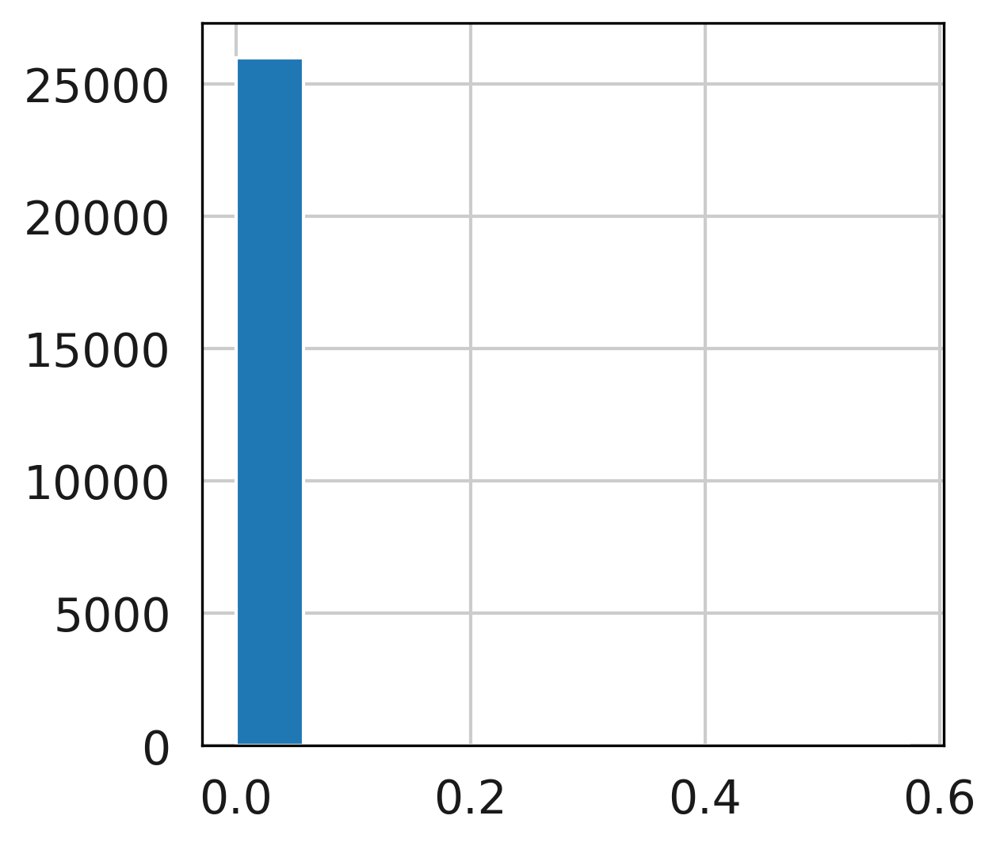

In [60]:
# to show counts data is not raw
array1 = adata2.X.toarray()
data = adata2.X.todense()
data1 = pd.DataFrame(data)
data1.columns = adata2.var.index
data1.index = adata2.obs.index
print(f'Data 1 counts min: {array1.min()}')
print(f'Data 1 counts max: {array1.max()}')
print('Plotting histogram of Data1 for Gene "FTL" to visualise general distribution of counts. Y axis: Cell number, X axis: Counts value')
plt.hist(data1.loc[:,'XKR4'])
plt.show() 
print("")

In [81]:
len(set(list(adata2.var[adata2.var['highly_variable']==True]['HGNC'])) & set(list(adata2.var[adata2.var['highly_variable']==True]['HGNC'])))

1404

In [85]:
# write out the var portions
adata.var[adata.var['highly_variable']==True].to_csv('./human_ets_ys_var.csv')
adata2.var[adata2.var['highly_variable']==True].to_csv('./mouse_ets_ys_var.csv')

# SAMAp

Self-Assembling Manifold mapping (SAMap) algorithm to enable mapping single-cell transcriptomes between phylogenetically remote species. SAMap relaxes the constraints imposed by sequence orthology, using expression similarity between mapped cells to infer the relative contributions of homologous genes, which in turn refines the cell type mapping. In addition, SAMap uses a graph-based data integration technique to identify reciprocally connected cell types across species with greater robustness than previous single-cell data integration methods (Haghverdi et al., 2018; Hie et al., 2019; Polański et al., 2019; Stuart et al., 2019).### Load pre-computed feature mappings


# Running BLAST
SAMap requires BLAST results between all pairs of species.

##     Generate gene homology graph via reciprocal BLAST

    We first construct a gene-gene bipartite graph between two species by performing reciprocal BLAST of their respective transcriptomes using tblastx, or proteomes using blastp. tblastn and blastx are used for BLAST between proteome and transcriptome. When a pair of genes share multiple High Scoring Pairs (HSPs), which are local regions of matching sequences, we use the HSP with the highest bit score to measure homology. Only pairs with E-value <10−6 are included in the graph.

    Although we define similarity using BLAST, SAMap is compatible with other protein homology detection methods (e.g. HMMER [Eddy, 2008]) or orthology inference tools (e.g. OrthoClust [Yan et al., 2014] and eggNOG [Huerta-Cepas et al., 2019]). While each of these methods has known strengths and limitations, BLAST is chosen for its broad usage, technical convenience, and compatibility with low-quality transcriptomes.

    We encode the BLAST results into two triangular adjacency matrices, A and B, each containing bit scores in one BLAST direction. We combine A and B to form a gene-gene adjacency matrix G. After symmetrizing G, we remove edges that only appear in one direction: G=Recip(12[(A+B)+(A+B)T])∈ℜm1+m2×m1+m2, where Recip only keeps reciprocal edges, and m1 and m2 are the number of genes of the two species, respectively. To filter out relatively weak homologies, we also remove edges where Gab<0.25maxb(Gab). Edge weights are then normalized by the maximum edge weight for each gene and transformed by a hyperbolic tangent function to increase discriminatory power between low and high edge weights, Gˆab=0.5+0.5tanh(10Gab/maxb(Gab)−5).

file1 = 'example_data/transcriptomes/schistosome_proteome.fasta' type1 = 'prot' #or 'prot' if file1 is a proteome id1 = 'sc' #2-character ID (e.g. 'sc' for schistosome) file2 = 'example_data/transcriptomes/planarian_transcriptome.fasta' type2 = 'nucl' id2 = 'pl' #2-character ID (e.g. 'pl' for planarian) !bash map_genes.sh --tr1 {file1} --t1 {type1} --n1 {id1} --tr2 {file2} --t2 {type2} --n2 {id2}
Below are what the BLAST output tables look like. There will be two tables: pl_to_sc.txt and sc_to_pl.txt which altogether describe the BLAST mappings in both directions.

(dd_Smed_v4... are planarian transcript IDs and Smp_... are schistosome transcript IDs).

Reciprocal BLAST hits will be used to construct the gene homology graph used by SAMap.

Column 10 displays the E-values (SAMap uses an e-value threshold of 1e-6). Column 11 displays the bit (sequence similarity) scores. The bit scores are used as the initial edge weights in the homology graph.

In [ ]:
from samap.mapping import SAMAP
from samap.analysis import (get_mapping_scores, GenePairFinder, transfer_annotations,
                            sankey_plot, chord_plot, CellTypeTriangles, 
                            ParalogSubstitutions, FunctionalEnrichment,
                            convert_eggnog_to_homologs, GeneTriangles)
from samalg import SAM
import pandas as pd

# Run SAM processing for each dataset

    Construct manifolds for each cell atlas separately using the SAM algorithm
    Request a detailed protocol
    The single-cell RNAseq datasets are normalized such that each cell has a total number of raw counts equal to the median size of single-cell libraries. Gene expressions are then log-normalized with the addition of a pseudocount of 1. Genes expressed (i.e. log2(D+1)>1) in greater than 96% of cells are filtered out. SAM is run using the following parameters: preprocessing = ‘StandardScaler’, weight_PCs = False, k = 20, and npcs = 150. A detailed description of parameters is provided previously (Tarashansky et al., 2019). SAM outputs N1 and N2, which are directed adjacency matrices that encode k-nearest neighbor graphs for the two datasets, respectively.

    SAM only includes the top 3000 genes ranked by SAM weights and the first 150 principal components (PCs) in the default mode to reduce computational complexity. However, downstream mapping requires PC loadings for all genes. Thus, in the final iteration of SAM, we run PCA on all genes and take the top 300 PCs. This step generates a loading matrix for each species i, Li∈ℜ300×mi.

In [101]:
#adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr.h5ad')
#adata2 = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad')

#adata.var_names_make_unique()
#keep = list(adata.var.index[~adata.var.index.str.contains('nan')])
#adata = adata[:, keep]

#adata2.var_names_make_unique()
#keep = list(adata2.var.index[~adata2.var.index.str.contains('nan')])
#adata2 = adata2[:, keep]
#adata2.var.index.name = None

#adata2.var['mm_HGNC'] = adata2.var['HGNC'][:]
#del adata2.var['HGNC']
#adata2.var = adata2.var.drop(list(adata2.var.columns),axis =1)
#del adata2.obsp
#del adata2.uns

#adata.write('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr.h5ad')
#adata2.write('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst_empty_var.h5ad')

### Define a dictionary of transcript HGNC names to corresponding ENSDB stable transcript IDs

In [135]:
adata2.var.index

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'AC149090.1', 'DHRSX', 'Vmn2r122', 'CAAA01147332.1'],
      dtype='object', name='HGNC', length=29452)

In [143]:
#adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad')
adata2.var_names_make_unique()
keep = list(adata2.var.index[~adata2.var.index.str.contains('nan')])
adata2 = adata2[:, keep]
adata2.var.index.name = None
mapping_mu = list(zip((adata2.var['ets']),adata2.var['HGNC']))

adata.var_names_make_unique()
keep = list(adata.var.index[~adata.var.index.str.contains('nan')])
adata = adata[:, keep]
adata.var.index.name = None
mapping_hu = list(zip((adata.var['ets']),list(adata.var.index.values)))

names = {'mu':mapping_mu,
        'hu':mapping_hu}

In [111]:
adata = sc.read('./human_ys_enst.h5ad')
adata2 = sc.read('./mouse_ys_enst.h5ad')

In [ ]:
fn1='/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst.h5ad'
fn2 = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad'
filenames = {'mu':fn2,'hu':fn1}
sm = SAMAP(filenames, f_maps = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/map_genes/maps/', names = names, save_processed=True)#if False, do not save the processed results to `*_pr.h5ad` )

Processing data mu from:
/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad
RUNNING SAM
Iteration: 0, Convergence: 1.0
Iteration: 1, Convergence: 0.9022833379578223
Computing the UMAP embedding...


In [ ]:
fn1=SAM()
fn1.load_data('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr.h5ad')

fn2=SAM()
fn2.load_data('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst_pr.h5ad')

filenames = {'hu':fn1,'mu':fn2}

sm = SAMAP(
        filenames,
        f_maps = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/map_genes/maps/',names = names)

In [ ]:
import pandas as pd
import scanpy as sc
df = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/map_genes/maps/humu/mu_to_hu.txt', delimiter = "\t",header=None)
len(df.loc[:,1].unique())

In [ ]:
from samap import utils
utils.save_samap(sm,"./SAMAP_human_mouse_prealigned")

In [ ]:
sm

### We can now run the SAMap algorithm using the run function. This function returns a SAM object with all species stitched together.

In [ ]:
samap = sm.run()

In [ ]:
utils.save_samap(samap,"./SAMAP_human_mouse_aligned")
samap_adata = samap.adata
samap_adata.write('./SAMAP_human_mouse_prealigned.h5ad')

# If loading pre made sam data

In [ ]:
adata2 = adata2[:, keep]

In [28]:
adata2

AnnData object with n_obs × n_vars = 25990 × 15505
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'species', 'species_donor', 'n_counts', 'restricted_celltype', 'leiden_clusters'
    var: 'mask_genes', 'means', 'variances', 'weights', 'spatial_dispersions'
    uns: 'path_to_file', 'preprocess_args', 'ranked_genes', 'run_args'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs', 'PCs_SAMap'
    layers: 'X_disp'
    obsp: 'connectivities', 'distances', 'nnm'

In [33]:
adata

View of AnnData object with n_obs × n_vars = 25990 × 15486
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'species', 'species_donor', 'n_counts', 'restricted_celltype'
    var: 'HGNC', 'ENSDB', 'mouse_human_homologs', 'DB Class Key_homogene_db', 'Common Organism Name_homogene_db', 'NCBI Taxon ID_homogene_db', 'Symbol_homogene_db', 'EntrezGene ID_homogene_db', 'Mouse MGI ID_homogene_db', 'HGNC ID_homogene_db', 'OMIM Gene ID_homogene_db', 'Genetic Location_homogene_db', 'Genomic Coordinates (mouse: , human: )_homogene_db', 'Nucleotide RefSeq IDs_homogene_db', 'Protein RefSeq IDs_homogene_db', 'SWISS_PROT IDs_homogene_db'

In [ ]:
# Correct wierd error which replaces enst with hgnc
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad')
adata2 =sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst_pr.h5ad')

hgnc_keep = list(adata2.var.index)
ents_keep = list(adata.var[adata.var["HGNC"].isin(hgnc_keep)].index.values)
adata.var.index.names = ['index']
adata = adata[:,ents_keep]

keys = list(adata.var.columns)
adata2.var.index = adata.var.index
adata2.var[keys] = adata.var[keys]


adata2.var.loc[adata2.var.index.str.contains('nan'),'ets'] = adata2.var.loc[adata2.var.index.str.contains('nan'),'HGNC']
adata2.var.index = adata2.var['ets']
adata2.write('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst_pr_pr.h5ad')

In [6]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst.h5ad')
adata.var_names_make_unique()
keep = list(adata.var.index[~adata.var.index.str.contains('nan')])
adata = adata[:, keep]
adata.var.index.name = None
mapping = list(zip((adata.var.index.values),adata.var['mouse_human_homologs']))
names = {'mu':mapping}

In [7]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr_pr.h5ad')
adata.var_names_make_unique()
adata.write('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr_pr.h5ad')
fn1=SAM()
fn1.load_data('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/human_ys_enst_pr_pr.h5ad')

fn2=SAM()
fn2.load_data('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mouse_ys_enst_empty_var_pr.h5ad')

filenames = {'hu':fn1,'mu':fn2}

sm = SAMAP(
        filenames,
        f_maps = '/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/SAMAp/map_genes/maps/',names = names)

3677 `hu` gene symbols match between the datasets and the BLAST graph.
1296 `mu` gene symbols match between the datasets and the BLAST graph.


In [8]:
from samap import utils
utils.save_samap(sm,"./SAMAP_human_mouse_prealigned")

In [9]:
sm

### We can now run the SAMap algorithm using the run function. This function returns a SAM object with all species stitched together.

In [10]:
samap = sm.run()

Prepping datasets for translation.
Translating feature spaces.
Projecting data into joint latent space. 9.607948541641235
Correcting data with means. 18.711803674697876
Expanding neighbourhoods of species hu...
Expanding neighbourhoods of species mu...
Indegree coarsening
0/9 (0, 160817)
1/9 (20000, 160817)
2/9 (40000, 160817)
3/9 (60000, 160817)
4/9 (80000, 160817)
5/9 (100000, 160817)
6/9 (120000, 160817)
7/9 (140000, 160817)
8/9 (160000, 160817)
Rescaling edge weights by expression correlations.
Concatenating SAM objects...
ITERATION: 0 
Average alignment score (A.S.):  0.3902874075317283 
Max A.S. improvement: 0.6339470475852114 
Min A.S. improvement: 0.0
Calculating gene-gene correlations in the homology graph...
Prepping datasets for translation.
Translating feature spaces.
Projecting data into joint latent space. 6.066754102706909
Correcting data with means. 15.036275625228882
Expanding neighbourhoods of species hu...
Expanding neighbourhoods of species mu...
Indegree coarsening

In [12]:
utils.save_samap(samap,"./SAMAP_human_mouse_aligned")
samap_adata = samap.adata
samap_adata.write('./SAMAP_human_mouse_prealigned.h5ad')

In [ ]:
samap_adata.obs['species']

In [ ]:
samap_adata

In [20]:
samap_adata.obs.loc[samap_adata.obs['species'].isin(['hu']),'cell.labels'].astype(str) + '_hu'

Cell_dat_Yolksac_Cell_dat_Yolksac_AAACCTGAGACCTTTG_1    hu_Sinusoidal_EC_hu
Cell_dat_Yolksac_Cell_dat_Yolksac_AAACCTGCACCTATCC_1             hu_MEMP_hu
Cell_dat_Yolksac_Cell_dat_Yolksac_AAACCTGCACTTAAGC_1           hu_HSPC_1_hu
Cell_dat_Yolksac_Cell_dat_Yolksac_AAACCTGGTAACGACG_1        hu_Erythroid_hu
Cell_dat_Yolksac_Cell_dat_Yolksac_AAACCTGGTCAAAGAT_1        hu_Erythroid_hu
                                                               ...         
F80_Yolksac_Hep_FCAImmP8096696_TTTGGTTCATCCGTGG             hu_Erythroid_hu
F80_Yolksac_Hep_FCAImmP8096696_TTTGTCAAGATGCCAG           hu_Immature_EC_hu
F80_Yolksac_Hep_FCAImmP8096696_TTTGTCAGTCGAACAG           hu_Immature_EC_hu
F80_Yolksac_Hep_FCAImmP8096696_TTTGTCATCATTCACT             hu_Erythroid_hu
F80_Yolksac_Hep_FCAImmP8096696_TTTGTCATCGGATGGA           hu_Mesothelium_hu
Name: cell.labels, Length: 134827, dtype: object

In [25]:
samap_adata.obs['celltype_species'] = ''
samap_adata.obs.loc[samap_adata.obs['species'].isin(['hu']),'celltype_species'] = samap_adata.obs.loc[samap_adata.obs['species'].isin(['hu']),'cell.labels'].astype(str) 
samap_adata.obs.loc[samap_adata.obs['species'].isin(['mu']),'celltype_species'] = samap_adata.obs.loc[samap_adata.obs['species'].isin(['mu']),'celltype'].astype(str) 

In [28]:
samap_adata

AnnData object with n_obs × n_vars = 160817 × 45835
    obs: 'barcode', 'broad_cell.labels', 'cell.labels', 'cell_cycle_score', 'celltype', 'cluster', 'cluster.stage', 'cluster.sub', 'cluster.theiler', 'colour', 'component', 'doub.density', 'doublet', 'endo_gephiX', 'endo_gephiY', 'endo_gutCluster', 'endo_gutDPT', 'endo_gutX', 'endo_gutY', 'endo_trajectoryDPT', 'endo_trajectoryName', 'fetal.ids', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'lanes', 'leiden_clusters', 'n_counts', 'orig.dataset', 'restricted_celltype', 'sample', 'sequencing.batch', 'sequencing.type', 'sex', 'sort.ids', 'species', 'species_donor', 'stage', 'stripped', 'theiler', 'umapX', 'umapY', 'batch', 'celltype_species'
    uns: 'neighbors', 'gnnm_corr', 'umap', 'homology_graph_reweighted', 'homology_graph', 'homology_gene_names', 'homology_gene_names_dict', 'celltype_species_colors', 'species_colors'
    obsm: 'wPCA', 'X_umap'
    layers: 'X_disp'
    obsp: 'connectivities', 'xsim', 'knn'

In [30]:
samap_adata.obsm

AxisArrays with keys: wPCA, X_umap

# Mapping table

In [ ]:
keys = {'hu':'corr_concat','mu':'corr_concat'}
D,MappingTable = get_mapping_scores(sm,keys,n_top = 0)

In [ ]:

sankey_plot(MappingTable, align_thr=0.05, species_order = ['hu','mu'])

In [5]:
r_sam = adata[:]
m_sam = adata2[:]

In [ ]:
save_samap(sm,base_path + "integration/SAMap/out/rabbit-mouse/notebook_samap_prealigned")

In [ ]:
aligned_sm = sm.run()

In [ ]:
save_samap(aligned_sm,"out/rabbit-mouse/notebook_samap_aligned")

In [ ]:
aligned_sm.adata

In [ ]:
aligned_sm.adata.write("mouse-extended/notebook_samap_aligned.h5ad")

In [ ]:
gpf = GenePairFinder(sm,keys=keys)

file1 = 'example_data/transcriptomes/schistosome_proteome.fasta' type1 = 'prot' #or 'prot' if file1 is a proteome 
id1 = 'sc' #2-character ID (e.g. 'sc' for schistosome) 
file2 = 'example_data/transcriptomes/planarian_transcriptome.fasta' 
type2 = 'nucl' 
id2 = 'pl' #2-character ID (e.g. 'pl' for planarian) 


!bash map_genes.sh --tr1 {file1} --t1 {type1} --n1 {id1} --tr2 {file2} --t2 {type2} --n2 {id2}

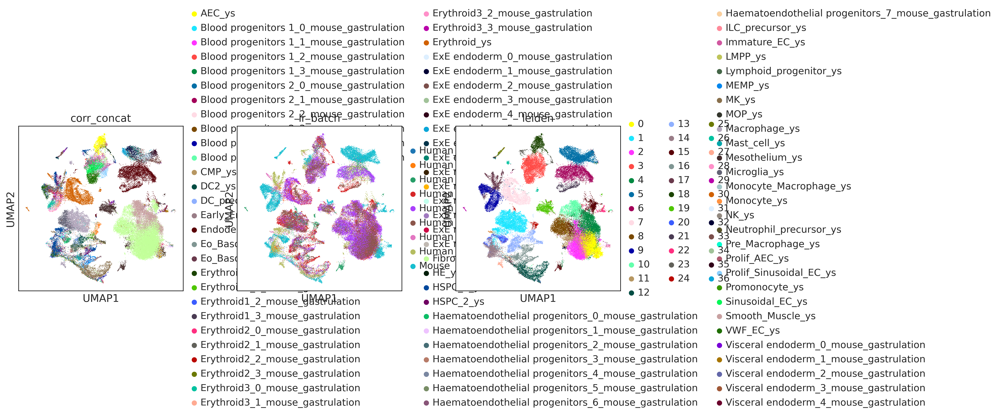

In [12]:
sc.pl.umap(adata,color = ["corr_concat",'lr_batch',"leiden"])

In [ ]:
adata.obs.to_csv('./combined_ys_fliv_mouse_111021_meta.h5ad')
remove = ['doublet', 'colour',
 'umapX',
 'umapY',
 'haem_gephiX',
 'haem_gephiY',
 'haem_subclust',
 'endo_gephiX',
 'endo_gephiY',
 'endo_trajectoryName',
 'endo_trajectoryDPT',
 'endo_gutX',
 'endo_gutY',
 'endo_gutDPT',
 'endo_gutCluster', 'theiler',
 'doub.density',
 'cluster',
 'cluster.sub',
 'cluster.stage',
 'cluster.theiler',
 'stripped',]
adata.obs = adata.obs.drop(remove,axis=1)

In [14]:
adata.write('./full_combined_ys_fliv_mouse_scaled_seperately_261021.h5ad')

# Export data from here and perform harmony optimisation prior to continuation
-- sil score high between samples and low kbet rejection rate = optimal

In [ ]:
np.corcoeff for high var genes between species between celltypes of interest

## Multinomial Logistic regression function to train data set and transfer labels
- multiclass case -> training algorithm uses the one-vs-rest (OvR) scheme if the ‘multi_class’ option is set to ‘ovr’, and uses the cross-entropy loss if the ‘multi_class’ option is set to ‘multinomial’.
- https://machinelearningmastery.com/cross-entropy-for-machine-learning/
- Entropy provides a measure of the average amount of information needed to represent an event drawn from a probability distribution for a random variable.
- cross-entropy can be thought to calculate the total entropy between the probability distributions.
- elastic_net_penalty = (alpha * l1_penalty) + ((1 – alpha) * l2_penalty)
- For example, an alpha of 0.5 would provide a 50 percent contribution of each penalty to the loss function. An alpha value of 0 gives all weight to the L2 penalty and a value of 1 gives all weight to the L1 penalty.
- A default value of lambda = 1.0 is used to use the fully weighted penalty; a value of 0 excludes the penalty. Very small values of lambda, such as 1e-3 or smaller, are common.
- elastic_net_loss = loss + (lambda * elastic_net_penalty)


In [17]:
# This function require compute power, will take a while 

def LR_compare(adata, train_x, train_label, subset_predict, subset_train, penalty=penalty, sparcity=sparcity, 
               col_name='predicted'):

    # adata - training+prediction adata object (combined). Pre-processed already
    # sparsity - larger sparsity, more bins, more conservative predictions, less accurate. Low sparist for clean output
                # A value of 0.2 is reasonable for L2 ridge regression
    # penalty - acts as buffer for assigning bins too harshly
    # train_x - arg refers to where you would like to derive your training reference from, i.e., GEX (X) or/elif.
                # PCA/UMAP in obsm. The two 'if' statements below handle train_x differently based on this
                # Based on train_x, the loops below compute 'train_label' (cell type values in training/landscape data) 
                # and 'predict_x'(prediction data equivalent of train_x)
    # train_label - cell type values in training/landscape data
    # subset_predict - mandatory subset of predict_x which contains metadata for expression
    # subset_train - mandatory subset of train_x which contains metadata for expression
    
    # Redefine LR parameters 'penalty' and 'sparsity' if you would like to deviate from defaults set above
    
    # Assign 'lr' as sklearn logistic regression func, with penalty and sparsity defined above
    lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter)
    
    if (penalty == "l1"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual = True, solver = 'liblinear',multi_class = 'ovr' ) # one-vs-rest
    if (penalty == "elasticnet"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual=False,solver = 'saga',l1_ratio=l1_ratio,multi_class = 'multinomial')

    if train_x == 'X':
        # Define training parameters
        train_label = adata.obs[common_cat].values
        train_label = train_label[subset_train]
        #train_x = adata.X,
        # Define prediction parameters
        #predict_x = train_x
        #train_x = train_x[subset_train, :] # issue line! subset_train = np.array(adata.obs[common_cat].isin(group1))
                                           # group1 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data1_group)]).unique()
                                           # Data1_group = data1 = healthy skin data , adata containing subsetting data to get metadata for expression prediction
                                           # adata.X = adata.X[np.array(adata.obs[common_cat].isin(group1)), :]
                                           # train_x = train_x[adata.obs[common_cat].isin(group1)]
        #predict_x = train_x
        #predict_x = predict_x[subset_predict]
        train_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_train].index))]
        predict_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_predict].index))]

    elif train_x in adata.obsm.keys():
        # Define training parameters
        train_label = adata.obs[common_cat].values
        train_label = train_label[subset_train]
        train_x = adata.obsm[train_x]
        predict_x = train_x
        train_x = train_x[subset_train, :]
        # Define prediction parameters
        predict_x = predict_x[subset_predict]
        predict_x = pd.DataFrame(predict_x)
        predict_x.index = adata.obs[subset_predict].index

    # Train predictive model using user defined partition labels (train_x ,train_label, predict_x)
    model = lr.fit(train_x, train_label)
    lr.fit(train_x, train_label)
    predict = lr.predict_proba(predict_x)

    # Create prediction table and map to adata.obs (in adata.obs["predict"] in the combined object), for the cells that
    # are in predict dataset
    predict = lr.predict(predict_x)
    predict = pd.DataFrame(predict)
    predict.index = adata.obs[subset_predict].index
    adata.obs[col_name] = adata.obs.index
    adata.obs[col_name] = adata.obs[col_name].map(predict[0])
    return model
    return lr

# Function to plot heatmap by percentage
def plot_df_heatmap(df, cmap='viridis', title=None, figsize=(7, 7), rotation=90, save=None, **kwargs):
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(df, cmap=cmap, aspect='auto', **kwargs)
    if 0 < rotation < 90:
        horizontalalignment = 'right'
    else:
        horizontalalignment = 'center'
    plt.xticks(
        range(len(df.columns)),
        df.columns,
        rotation=rotation,
        horizontalalignment=horizontalalignment,
    )
    plt.yticks(range(len(df.index)), df.index)
    if title:
        fig.suptitle(title)
    #fig.colorbar(im)
    if save:
        plt.savefig(fname=save, bbox_inches='tight', pad_inches=0.1)


# Plot probability table by html
def cross_table(adata, x, y, normalise=None, highlight=False, subset=None):                                                                                                                                                                                              
    """Make a cross table comparing two categorical annotations
    """
    x_attr = adata.obs[x]
    y_attr = adata.obs[y]
    if subset is not None:
        x_attr = x_attr[subset]
        y_attr = y_attr[subset]
    crs_tbl = pd.crosstab(x_attr, y_attr)
    if normalise == 'x':
        x_sizes = x_attr.groupby(x_attr).size().values
        crs_tbl = (crs_tbl.T / x_sizes).round(2).T
    elif normalise == 'y':
        y_sizes = x_attr.groupby(y_attr).size().values
        crs_tbl = (crs_tbl / y_sizes).round(2)
    if highlight:
        return crs_tbl.style.background_gradient(cmap='viridis', axis=0)
    return crs_tbl

# Define the separator category in the column of interest, this works by partial matches and enables a-symmetric 
# comparisons
Data1_group = data1
Data2_group = data2
# Define the common .obs column between concatinated data
common_cat = "corr_concat"

# This block defines subset_predict and subset_train and also runs LR_compare function
group1 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data1_group)]).unique()
group1 = list(group1)
group2 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data2_group)]).unique()
group2 = list(group2)
subset_predict = np.array(adata.obs[common_cat].isin(group2))
subset_train = np.array(adata.obs[common_cat].isin(group1))
train_label = (adata.obs[common_cat][adata.obs[common_cat].isin(group1)]).values

In [18]:
def LR_compare(adata, train_x, train_label, subset_predict, subset_train, penalty=penalty, sparcity=sparcity, 
               col_name='predicted'):

    # adata - training+prediction adata object (combined). Pre-processed already
    # sparsity - larger sparsity, more bins, more conservative predictions, less accurate. Low sparist for clean output
                # A value of 0.2 is reasonable for L2 ridge regression
    # penalty - acts as buffer for assigning bins too harshly
    # train_x - arg refers to where you would like to derive your training reference from, i.e., GEX (X) or/elif.
                # PCA/UMAP in obsm. The two 'if' statements below handle train_x differently based on this
                # Based on train_x, the loops below compute 'train_label' (cell type values in training/landscape data) 
                # and 'predict_x'(prediction data equivalent of train_x)
    # train_label - cell type values in training/landscape data
    # subset_predict - mandatory subset of predict_x which contains metadata for expression
    # subset_train - mandatory subset of train_x which contains metadata for expression
    
    # Redefine LR parameters 'penalty' and 'sparsity' if you would like to deviate from defaults set above
    
    # Assign 'lr' as sklearn logistic regression func, with penalty and sparsity defined above
    lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter)
    
    if (penalty == "l1"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual = True, solver = 'liblinear',multi_class = 'ovr' ) # one-vs-rest
    if (penalty == "elasticnet"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual=False,solver = 'saga',l1_ratio=l1_ratio,multi_class = 'multinomial')

    if train_x == 'X':
        # Define training parameters
        train_label = adata.obs[common_cat].values
        predict_label = train_label[subset_predict]
        train_label = train_label[subset_train]
        #train_x = adata.X,
        # Define prediction parameters
        #predict_x = train_x
        #train_x = train_x[subset_train, :] # issue line! subset_train = np.array(adata.obs[common_cat].isin(group1))
                                           # group1 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data1_group)]).unique()
                                           # Data1_group = data1 = healthy skin data , adata containing subsetting data to get metadata for expression prediction
                                           # adata.X = adata.X[np.array(adata.obs[common_cat].isin(group1)), :]
                                           # train_x = train_x[adata.obs[common_cat].isin(group1)]
        #predict_x = train_x
        #predict_x = predict_x[subset_predict]
        train_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_train].index))]
        predict_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_predict].index))]

    elif train_x in adata.obsm.keys():
        # Define training parameters
        train_label = adata.obs[common_cat].values
        predict_label = train_label[subset_predict]
        train_label = train_label[subset_train]
        train_x = adata.obsm[train_x]
        predict_x = train_x
        train_x = train_x[subset_train, :]
        # Define prediction parameters
        predict_x = predict_x[subset_predict]
        predict_x = pd.DataFrame(predict_x)
        predict_x.index = adata.obs[subset_predict].index

    # Train predictive model using user defined partition labels (train_x ,train_label, predict_x)
    model = lr.fit(train_x, train_label)
    lr.fit(train_x, train_label)
    predict = lr.predict_proba(predict_x)

    # Create prediction table and map to adata.obs (in adata.obs["predict"] in the combined object), for the cells that
    # are in predict dataset
    predict = lr.predict(predict_x)
    predict = pd.DataFrame(predict)
    predict.index = adata.obs[subset_predict].index
    adata.obs[col_name] = adata.obs.index
    adata.obs[col_name] = adata.obs[col_name].map(predict[0])
    return lr

# Tune penalties used in the model

### Warning! This takes a very long time with big data! Suggest using a small subset of data to validate
- Use the GridsearchCV class qwith a grid of values defined
- Ignore the sign; the library makes the MAE negative for optimization purposes.

- We can see that the model assigned an alpha weight of 0.01 to the penalty and focuses exclusively on the L2 penalty.

- Rank models by Mean absolute error: The mean_absolute_error function computes mean absolute error, a risk metric corresponding to the expected value of the absolute error loss or L1-norm loss.

In [ ]:
adata_tuning.obs[common_cat].values

In [144]:
subset_train = np.array(adata.obs[common_cat].isin(group1))
train_label = (adata.obs[common_cat][adata.obs[common_cat].isin(group1)]).values

In [145]:
subset_train

array([False, False, False, ...,  True,  True,  True])

In [217]:
# Subset and create samller dataset for hyperparam tuning
#train_x = 'X_pca'
tune_train_x = train_x[:]
prop = 0.2
data = adata.obs
grouped = data.groupby(common_cat)
df = grouped.apply(lambda x: x.sample(frac=prop))
df = df.droplevel(common_cat)
keep = df.index
adata_tuning = adata[adata.obs.index.isin(keep)]

df = df.loc[df[common_cat].isin(group1)]
tune_subset_train = np.array(adata_tuning.obs[common_cat].isin(group1))

tune_train_label = df.loc[df[common_cat].isin(group1),[common_cat]].values
tune_train_x = adata_tuning.obsm[tune_train_x]
tune_train_x = tune_train_x[tune_subset_train, :]

# Create a training class index
#train_indexes = dict(zip(set(group1),set([str(x) for x in list(range(0,len(group1)))])))
#df['train_classes'] = df[common_cat].astype(str).map(train_indexes)
#tune_train_label = df.loc[df[common_cat].isin(group1),['train_classes']].values

In [219]:
model = LogisticRegression(penalty = penalty, max_iter =  max_iter, dual=False,solver = 'saga', multi_class = 'multinomial',l1_ratio=1)
model.fit(X,y)

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


LogisticRegression(l1_ratio=1, max_iter=200, multi_class='multinomial',
                   penalty='elasticnet', solver='saga')

In [ ]:
## tune regularization for multinomial logistic regression
X = tune_train_x
y = tune_train_label

# define model
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
model = LogisticRegression(penalty = penalty, max_iter =  max_iter, dual=False,solver = 'saga', multi_class = 'multinomial')

# define grid
grid = dict()
grid['C'] = [0.0, 1.0]
grid['l1_ratio'] = arange(0, 1, 0.1)
# define search
search = GridSearchCV(model, grid, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X, y)
# summarize
print('MAE: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

In [ ]:
import pandas as pd

results_df = pd.DataFrame(search.cv_results_)
results_df = results_df.sort_values(by=['rank_test_score'])
results_df = (
    results_df
    .set_index(results_df["params"].apply(
        lambda x: "_".join(str(val) for val in x.values()))
    )
    .rename_axis('kernel')
)
results_df[
    ['params', 'rank_test_score', 'mean_test_score', 'std_test_score']
]


In [ ]:
# create df of model scores ordered by performance
model_scores = results_df.filter(regex=r'split\d*_test_score')

# plot 30 examples of dependency between cv fold and AUC scores
fig, ax = plt.subplots()
sns.lineplot(
    data=model_scores.transpose().iloc[:30],
    dashes=False, palette='Set1', marker='o', alpha=.5, ax=ax
)
ax.set_xlabel("CV test fold", size=12, labelpad=10)
ax.set_ylabel("Model AUC", size=12)
ax.tick_params(bottom=True, labelbottom=False)
plt.show()

# print correlation of AUC scores across folds
print(f"Correlation of models:\n {model_scores.transpose().corr()}")

In [36]:
    common_cat = 'corr_concat'
    col_name='predicted'
    train_x = 'X_pca'
    # adata - training+prediction adata object (combined). Pre-processed already
    # sparsity - larger sparsity, more bins, more conservative predictions, less accurate. Low sparist for clean output
                # A value of 0.2 is reasonable for L2 ridge regression
    # penalty - acts as buffer for assigning bins too harshly
    # train_x - arg refers to where you would like to derive your training reference from, i.e., GEX (X) or/elif.
                # PCA/UMAP in obsm. The two 'if' statements below handle train_x differently based on this
                # Based on train_x, the loops below compute 'train_label' (cell type values in training/landscape data) 
                # and 'predict_x'(prediction data equivalent of train_x)
    # train_label - cell type values in training/landscape data
    # subset_predict - mandatory subset of predict_x which contains metadata for expression
    # subset_train - mandatory subset of train_x which contains metadata for expression
    
    # Redefine LR parameters 'penalty' and 'sparsity' if you would like to deviate from defaults set above
    
    # Assign 'lr' as sklearn logistic regression func, with penalty and sparsity defined above
    lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter)
    
    if (penalty == "l1"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual = True, solver = 'liblinear',multi_class = 'ovr' ) # one-vs-rest
    if (penalty == "elasticnet"):
        lr = LogisticRegression(penalty = penalty, C = sparcity, max_iter =  max_iter, dual=False,solver = 'saga',l1_ratio=l1_ratio,multi_class = 'multinomial')

    if train_x == 'X':
        # Define training parameters
        train_label = adata.obs[common_cat].values
        predict_label = train_label[subset_predict]
        train_label = train_label[subset_train]
        #train_x = adata.X,
        # Define prediction parameters
        #predict_x = train_x
        #train_x = train_x[subset_train, :] # issue line! subset_train = np.array(adata.obs[common_cat].isin(group1))
                                           # group1 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data1_group)]).unique()
                                           # Data1_group = data1 = healthy skin data , adata containing subsetting data to get metadata for expression prediction
                                           # adata.X = adata.X[np.array(adata.obs[common_cat].isin(group1)), :]
                                           # train_x = train_x[adata.obs[common_cat].isin(group1)]
        #predict_x = train_x
        #predict_x = predict_x[subset_predict]
        train_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_train].index))]
        predict_x = adata.X[adata.obs.index.isin(list(adata.obs[subset_predict].index))]

    elif train_x in adata.obsm.keys():
        # Define training parameters
        train_label = adata.obs[common_cat].values
        predict_label = train_label[subset_predict]
        train_label = train_label[subset_train]
        train_x = adata.obsm[train_x]
        predict_x = train_x
        train_x = train_x[subset_train, :]
        # Define prediction parameters
        predict_x = predict_x[subset_predict]
        predict_x = pd.DataFrame(predict_x)
        predict_x.index = adata.obs[subset_predict].index

    # Train predictive model using user defined partition labels (train_x ,train_label, predict_x)
    lr.fit(train_x, train_label)
    predict_proba = lr.predict_proba(predict_x)

    # Create prediction table and map to adata.obs (in adata.obs["predict"] in the combined object), for the cells that
    # are in predict dataset
    predict = lr.predict(predict_x)
    predict = pd.DataFrame(predict)
    predict.index = adata.obs[subset_predict].index
    adata.obs[col_name] = adata.obs.index
    adata.obs[col_name] = adata.obs[col_name].map(predict[0])

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


In [ ]:
## elastic_net_penalty = (alpha * l1_penalty) + ((1 – alpha) * l2_penalty)

In [43]:
train_label

['Sinusoidal_EC_ys', 'MEMP_ys', 'HSPC_1_ys', 'Endoderm_ys', 'Immature_EC_ys', ..., 'Fibroblast_ys', 'Mesothelium_ys', 'Immature_EC_ys', 'Immature_EC_ys', 'Mesothelium_ys']
Length: 53752
Categories (84, object): ['AEC_ys', 'Blood progenitors 1_0_mouse_gastrulation', 'Blood progenitors 1_1_mouse_gastrulation', 'Blood progenitors 1_2_mouse_gastrulation', ..., 'Visceral endoderm_1_mouse_gastrulation', 'Visceral endoderm_2_mouse_gastrulation', 'Visceral endoderm_3_mouse_gastrulation', 'Visceral endoderm_4_mouse_gastrulation']

In [21]:
adata.obs.index[adata.obs[common_cat].isin(subset_predict)]

Index([], dtype='object')

In [44]:
predict = lr.predict(predict_x)
predict_proba = lr.predict_proba(predict_x)
predict

array(['Endoderm_ys', 'Endoderm_ys', 'Fibroblast_ys', ..., 'Erythroid_ys',
       'Erythroid_ys', 'Erythroid_ys'], dtype=object)

In [45]:
dir(lr)
lr.intercept_
lr.coef_
lr.classes_

array(['AEC_ys', 'CMP_ys', 'DC2_ys', 'DC_precursor_ys',
       'Early_Erythroid_ys', 'Endoderm_ys', 'Eo_Baso_Mast_precursor_ys',
       'Eo_Basophil_ys', 'Erythroid_ys', 'Fibroblast_ys', 'HE_ys',
       'HSPC_1_ys', 'HSPC_2_ys', 'ILC_precursor_ys', 'Immature_EC_ys',
       'LMPP_ys', 'Lymphoid_progenitor_ys', 'MEMP_ys', 'MK_ys', 'MOP_ys',
       'Macrophage_ys', 'Mast_cell_ys', 'Mesothelium_ys', 'Microglia_ys',
       'Monocyte_Macrophage_ys', 'Monocyte_ys', 'NK_ys',
       'Neutrophil_precursor_ys', 'Pre_Macrophage_ys', 'Prolif_AEC_ys',
       'Prolif_Sinusoidal_EC_ys', 'Promonocyte_ys', 'Sinusoidal_EC_ys',
       'Smooth_Muscle_ys', 'VWF_EC_ys'], dtype=object)

In [46]:
lr.intercept_

array([-0.62039703, -0.11831144, -0.35184216, -0.21246126,  0.0278333 ,
        0.41652808, -0.19542553, -0.1908424 , -0.23640826,  4.2205386 ,
       -0.11351597,  0.72985685,  0.02027917, -0.10171668,  0.01378498,
       -0.20978935, -0.19434352,  0.15904397,  0.13729177, -0.12521255,
       -0.39262998, -0.16902703, -0.4644147 , -0.20778124, -0.11350568,
       -0.36888438, -0.08712243, -0.35494232, -0.36543036, -0.24339421,
       -0.3728993 , -0.03213347, -0.69727767,  0.5108517 , -0.68108654],
      dtype=float32)

# Repeated k-Fold Cross-Validation for Model Evaluation
-https://machinelearningmastery.com/repeated-k-fold-cross-validation-with-python/

# Weighted F1 and precision recall
-https://towardsdatascience.com/multi-class-metrics-made-simple-part-i-precision-and-recall-9250280bddc2

In [ ]:
## Report accuracy score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn import metrics
import seaborn as sn
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

model = lr

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=5, random_state=1)
# evaluate the model and collect the scores
n_scores = cross_val_score(lr, train_x, train_label, scoring='accuracy', cv=cv, n_jobs=-1)
# report the model performance
print('Mean Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))

# Report Precision score
metric = pd.DataFrame((metrics.classification_report(train_label, model.predict(train_x), digits=3,output_dict=True))).T

cm = confusion_matrix(train_label, model.predict(train_x))
#cm = confusion_matrix(train_label, model.predict_proba(train_x))

df_cm = pd.DataFrame(cm, index = lr.classes_,
                  columns = lr.classes_)
df_cm = (df_cm / df_cm.sum(axis=0))*100
plt.figure(figsize = (20,15))
sn.set(font_scale=1) # for label size
pal = sns.diverging_palette(240, 10, n=10)
plt.suptitle(('Mean Accuracy 5 fold: %.3f std: %.3f' % (np.mean(n_scores),  np.std(n_scores))), y=1.05, fontsize=18)

#Plot precision recall and recall
table = plt.table(cellText=metric.values,colWidths = [1]*len(metric.columns),
rowLabels=metric.index,
colLabels=metric.columns,
cellLoc = 'center', rowLoc = 'center',
loc='bottom', bbox=[0.25, -0.6, 0.5, 0.3])
table.scale(1, 2)
table.set_fontsize(16)

sn.heatmap(df_cm, annot=True, annot_kws={"size": 16},cmap=pal) # font size
print(metrics.classification_report(train_label, model.predict(train_x), digits=3))

In [ ]:
adata.X

# Model predictions

In [48]:
from sklearn.datasets import load_iris
X, y = load_iris(return_X_y=True)
clf = LogisticRegression(random_state=0).fit(X, y)
clf.predict(X[:2, :])
clf.score(X, y)

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9733333333333334

In [49]:
model.predict(predict_x)

array(['Endoderm_ys', 'Endoderm_ys', 'Fibroblast_ys', ..., 'Erythroid_ys',
       'Erythroid_ys', 'Erythroid_ys'], dtype=object)

In [50]:
model = lr
pred_out = pd.DataFrame(model.predict(predict_x),columns = ['predicted'],index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out['orig_labels'] = predict_label
proba = pd.DataFrame(model.predict_proba(predict_x),columns = lr.classes_,index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out = pred_out.join(proba)
pred_out

,predicted,orig_labels,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
cell_55,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,3.148413e-08,1.279895e-07,3.643769e-08,2.850861e-08,2.326306e-09,0.999997,6.003891e-09,2.637212e-09,...,2.958038e-08,1.744235e-09,1.898517e-07,6.740841e-11,9.585259e-10,1.760104e-08,1.376409e-07,1.178145e-08,2.939263e-09,4.698258e-08
cell_56,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,8.365948e-09,2.269404e-08,9.524119e-09,6.530287e-09,3.748942e-09,0.999998,7.181957e-10,6.921471e-10,...,1.682824e-09,3.083764e-10,2.509807e-08,6.585212e-12,4.091851e-10,1.041129e-08,2.298990e-08,4.273925e-10,1.677458e-10,5.359466e-10
cell_58,Fibroblast_ys,ExE endoderm_4_mouse_gastrulation,7.783951e-07,2.723316e-07,1.986350e-06,5.025419e-07,7.365959e-07,0.000006,1.371339e-06,1.206558e-06,...,2.034650e-06,7.406306e-07,2.636154e-06,8.819951e-07,1.092588e-07,2.792638e-08,1.353829e-05,6.669790e-08,2.028345e-01,6.269178e-08
cell_64,Smooth_Muscle_ys,Visceral endoderm_3_mouse_gastrulation,4.196723e-07,2.899305e-07,7.363604e-07,1.686518e-05,2.104065e-06,0.000175,2.070984e-06,1.944944e-06,...,1.503654e-06,1.457492e-06,4.720553e-06,1.531726e-07,2.594475e-07,5.758365e-08,2.872336e-06,3.862387e-08,7.576867e-01,8.087050e-07
cell_73,Endoderm_ys,ExE endoderm_0_mouse_gastrulation,3.077016e-08,3.939567e-08,1.120759e-08,4.621237e-08,3.673080e-09,0.999989,2.388365e-08,1.224931e-08,...,6.273486e-08,1.870370e-09,1.694607e-07,3.646580e-10,3.500788e-09,9.340017e-08,1.748798e-07,1.092625e-08,3.879923e-09,3.742975e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139315,Erythroid_ys,Erythroid1_3_mouse_gastrulation,8.830177e-06,8.621564e-04,3.895851e-04,1.450092e-04,3.085233e-02,0.000956,3.658607e-03,4.307521e-04,...,4.936608e-05,1.164906e-03,2.846584e-04,1.389002e-05,1.262750e-05,4.562891e-05,8.436834e-04,1.588594e-05,5.318076e-07,1.293981e-05
cell_139321,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.549688e-07,2.804319e-05,2.720301e-06,1.716991e-05,2.842162e-02,0.000150,4.683377e-04,3.690347e-05,...,2.862017e-06,6.558965e-05,2.036406e-05,4.522426e-05,2.257839e-06,3.184151e-06,5.376613e-05,2.233156e-06,7.483369e-09,2.448486e-07
cell_139326,Erythroid_ys,Erythroid3_0_mouse_gastrulation,4.876582e-07,5.146406e-05,7.137331e-06,1.990991e-05,1.612777e-02,0.000384,2.669206e-04,1.075408e-04,...,4.520391e-06,1.015905e-04,2.725474e-05,5.202698e-05,2.648684e-06,8.484605e-06,1.056678e-04,2.901508e-06,6.876054e-09,3.122221e-07
cell_139327,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.452612e-07,5.356186e-05,5.726853e-06,1.509736e-05,9.736003e-03,0.000415,4.355587e-04,6.756751e-05,...,4.035994e-06,1.050346e-04,5.819642e-05,1.825603e-05,3.329855e-06,6.225499e-06,7.769057e-05,1.051696e-06,5.990421e-09,1.949167e-07


In [51]:
proba = pd.DataFrame(model.predict_proba(predict_x),columns = lr.classes_,index = adata.obs.index[adata.obs[common_cat].isin(group2)])
#np.log(proba)
proba

,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,Erythroid_ys,Fibroblast_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
cell_55,3.148413e-08,1.279895e-07,3.643769e-08,2.850861e-08,2.326306e-09,0.999997,6.003891e-09,2.637212e-09,5.667765e-08,1.469778e-07,...,2.958038e-08,1.744235e-09,1.898517e-07,6.740841e-11,9.585259e-10,1.760104e-08,1.376409e-07,1.178145e-08,2.939263e-09,4.698258e-08
cell_56,8.365948e-09,2.269404e-08,9.524119e-09,6.530287e-09,3.748942e-09,0.999998,7.181957e-10,6.921471e-10,5.117703e-08,8.014318e-09,...,1.682824e-09,3.083764e-10,2.509807e-08,6.585212e-12,4.091851e-10,1.041129e-08,2.298990e-08,4.273925e-10,1.677458e-10,5.359466e-10
cell_58,7.783951e-07,2.723316e-07,1.986350e-06,5.025419e-07,7.365959e-07,0.000006,1.371339e-06,1.206558e-06,2.969462e-07,7.187002e-01,...,2.034650e-06,7.406306e-07,2.636154e-06,8.819951e-07,1.092588e-07,2.792638e-08,1.353829e-05,6.669790e-08,2.028345e-01,6.269178e-08
cell_64,4.196723e-07,2.899305e-07,7.363604e-07,1.686518e-05,2.104065e-06,0.000175,2.070984e-06,1.944944e-06,4.037969e-08,2.208163e-01,...,1.503654e-06,1.457492e-06,4.720553e-06,1.531726e-07,2.594475e-07,5.758365e-08,2.872336e-06,3.862387e-08,7.576867e-01,8.087050e-07
cell_73,3.077016e-08,3.939567e-08,1.120759e-08,4.621237e-08,3.673080e-09,0.999989,2.388365e-08,1.224931e-08,2.511722e-07,7.163193e-08,...,6.273486e-08,1.870370e-09,1.694607e-07,3.646580e-10,3.500788e-09,9.340017e-08,1.748798e-07,1.092625e-08,3.879923e-09,3.742975e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139315,8.830177e-06,8.621564e-04,3.895851e-04,1.450092e-04,3.085233e-02,0.000956,3.658607e-03,4.307521e-04,7.123986e-01,3.396288e-06,...,4.936608e-05,1.164906e-03,2.846584e-04,1.389002e-05,1.262750e-05,4.562891e-05,8.436834e-04,1.588594e-05,5.318076e-07,1.293981e-05
cell_139321,4.549688e-07,2.804319e-05,2.720301e-06,1.716991e-05,2.842162e-02,0.000150,4.683377e-04,3.690347e-05,9.415332e-01,1.013638e-07,...,2.862017e-06,6.558965e-05,2.036406e-05,4.522426e-05,2.257839e-06,3.184151e-06,5.376613e-05,2.233156e-06,7.483369e-09,2.448486e-07
cell_139326,4.876582e-07,5.146406e-05,7.137331e-06,1.990991e-05,1.612777e-02,0.000384,2.669206e-04,1.075408e-04,9.575050e-01,1.179962e-07,...,4.520391e-06,1.015905e-04,2.725474e-05,5.202698e-05,2.648684e-06,8.484605e-06,1.056678e-04,2.901508e-06,6.876054e-09,3.122221e-07
cell_139327,4.452612e-07,5.356186e-05,5.726853e-06,1.509736e-05,9.736003e-03,0.000415,4.355587e-04,6.756751e-05,9.588054e-01,1.417569e-07,...,4.035994e-06,1.050346e-04,5.819642e-05,1.825603e-05,3.329855e-06,6.225499e-06,7.769057e-05,1.051696e-06,5.990421e-09,1.949167e-07


In [84]:
pred_out = pd.DataFrame(model.predict(predict_x),columns = ['predicted'],index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out['orig_labels'] = predict_label
proba = pd.DataFrame(model.predict_proba(predict_x),columns = lr.classes_,index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out = pred_out.join(proba)
pred_out

,predicted,orig_labels,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
cell_55,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,3.148413e-08,1.279895e-07,3.643769e-08,2.850861e-08,2.326306e-09,0.999997,6.003891e-09,2.637212e-09,...,2.958038e-08,1.744235e-09,1.898517e-07,6.740841e-11,9.585259e-10,1.760104e-08,1.376409e-07,1.178145e-08,2.939263e-09,4.698258e-08
cell_56,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,8.365948e-09,2.269404e-08,9.524119e-09,6.530287e-09,3.748942e-09,0.999998,7.181957e-10,6.921471e-10,...,1.682824e-09,3.083764e-10,2.509807e-08,6.585212e-12,4.091851e-10,1.041129e-08,2.298990e-08,4.273925e-10,1.677458e-10,5.359466e-10
cell_58,Fibroblast_ys,ExE endoderm_4_mouse_gastrulation,7.783951e-07,2.723316e-07,1.986350e-06,5.025419e-07,7.365959e-07,0.000006,1.371339e-06,1.206558e-06,...,2.034650e-06,7.406306e-07,2.636154e-06,8.819951e-07,1.092588e-07,2.792638e-08,1.353829e-05,6.669790e-08,2.028345e-01,6.269178e-08
cell_64,Smooth_Muscle_ys,Visceral endoderm_3_mouse_gastrulation,4.196723e-07,2.899305e-07,7.363604e-07,1.686518e-05,2.104065e-06,0.000175,2.070984e-06,1.944944e-06,...,1.503654e-06,1.457492e-06,4.720553e-06,1.531726e-07,2.594475e-07,5.758365e-08,2.872336e-06,3.862387e-08,7.576867e-01,8.087050e-07
cell_73,Endoderm_ys,ExE endoderm_0_mouse_gastrulation,3.077016e-08,3.939567e-08,1.120759e-08,4.621237e-08,3.673080e-09,0.999989,2.388365e-08,1.224931e-08,...,6.273486e-08,1.870370e-09,1.694607e-07,3.646580e-10,3.500788e-09,9.340017e-08,1.748798e-07,1.092625e-08,3.879923e-09,3.742975e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139315,Erythroid_ys,Erythroid1_3_mouse_gastrulation,8.830177e-06,8.621564e-04,3.895851e-04,1.450092e-04,3.085233e-02,0.000956,3.658607e-03,4.307521e-04,...,4.936608e-05,1.164906e-03,2.846584e-04,1.389002e-05,1.262750e-05,4.562891e-05,8.436834e-04,1.588594e-05,5.318076e-07,1.293981e-05
cell_139321,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.549688e-07,2.804319e-05,2.720301e-06,1.716991e-05,2.842162e-02,0.000150,4.683377e-04,3.690347e-05,...,2.862017e-06,6.558965e-05,2.036406e-05,4.522426e-05,2.257839e-06,3.184151e-06,5.376613e-05,2.233156e-06,7.483369e-09,2.448486e-07
cell_139326,Erythroid_ys,Erythroid3_0_mouse_gastrulation,4.876582e-07,5.146406e-05,7.137331e-06,1.990991e-05,1.612777e-02,0.000384,2.669206e-04,1.075408e-04,...,4.520391e-06,1.015905e-04,2.725474e-05,5.202698e-05,2.648684e-06,8.484605e-06,1.056678e-04,2.901508e-06,6.876054e-09,3.122221e-07
cell_139327,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.452612e-07,5.356186e-05,5.726853e-06,1.509736e-05,9.736003e-03,0.000415,4.355587e-04,6.756751e-05,...,4.035994e-06,1.050346e-04,5.819642e-05,1.825603e-05,3.329855e-06,6.225499e-06,7.769057e-05,1.051696e-06,5.990421e-09,1.949167e-07


# Mean prediction probabilities

In [85]:
pred_out

,predicted,orig_labels,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
cell_55,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,3.148413e-08,1.279895e-07,3.643769e-08,2.850861e-08,2.326306e-09,0.999997,6.003891e-09,2.637212e-09,...,2.958038e-08,1.744235e-09,1.898517e-07,6.740841e-11,9.585259e-10,1.760104e-08,1.376409e-07,1.178145e-08,2.939263e-09,4.698258e-08
cell_56,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,8.365948e-09,2.269404e-08,9.524119e-09,6.530287e-09,3.748942e-09,0.999998,7.181957e-10,6.921471e-10,...,1.682824e-09,3.083764e-10,2.509807e-08,6.585212e-12,4.091851e-10,1.041129e-08,2.298990e-08,4.273925e-10,1.677458e-10,5.359466e-10
cell_58,Fibroblast_ys,ExE endoderm_4_mouse_gastrulation,7.783951e-07,2.723316e-07,1.986350e-06,5.025419e-07,7.365959e-07,0.000006,1.371339e-06,1.206558e-06,...,2.034650e-06,7.406306e-07,2.636154e-06,8.819951e-07,1.092588e-07,2.792638e-08,1.353829e-05,6.669790e-08,2.028345e-01,6.269178e-08
cell_64,Smooth_Muscle_ys,Visceral endoderm_3_mouse_gastrulation,4.196723e-07,2.899305e-07,7.363604e-07,1.686518e-05,2.104065e-06,0.000175,2.070984e-06,1.944944e-06,...,1.503654e-06,1.457492e-06,4.720553e-06,1.531726e-07,2.594475e-07,5.758365e-08,2.872336e-06,3.862387e-08,7.576867e-01,8.087050e-07
cell_73,Endoderm_ys,ExE endoderm_0_mouse_gastrulation,3.077016e-08,3.939567e-08,1.120759e-08,4.621237e-08,3.673080e-09,0.999989,2.388365e-08,1.224931e-08,...,6.273486e-08,1.870370e-09,1.694607e-07,3.646580e-10,3.500788e-09,9.340017e-08,1.748798e-07,1.092625e-08,3.879923e-09,3.742975e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139315,Erythroid_ys,Erythroid1_3_mouse_gastrulation,8.830177e-06,8.621564e-04,3.895851e-04,1.450092e-04,3.085233e-02,0.000956,3.658607e-03,4.307521e-04,...,4.936608e-05,1.164906e-03,2.846584e-04,1.389002e-05,1.262750e-05,4.562891e-05,8.436834e-04,1.588594e-05,5.318076e-07,1.293981e-05
cell_139321,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.549688e-07,2.804319e-05,2.720301e-06,1.716991e-05,2.842162e-02,0.000150,4.683377e-04,3.690347e-05,...,2.862017e-06,6.558965e-05,2.036406e-05,4.522426e-05,2.257839e-06,3.184151e-06,5.376613e-05,2.233156e-06,7.483369e-09,2.448486e-07
cell_139326,Erythroid_ys,Erythroid3_0_mouse_gastrulation,4.876582e-07,5.146406e-05,7.137331e-06,1.990991e-05,1.612777e-02,0.000384,2.669206e-04,1.075408e-04,...,4.520391e-06,1.015905e-04,2.725474e-05,5.202698e-05,2.648684e-06,8.484605e-06,1.056678e-04,2.901508e-06,6.876054e-09,3.122221e-07
cell_139327,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.452612e-07,5.356186e-05,5.726853e-06,1.509736e-05,9.736003e-03,0.000415,4.355587e-04,6.756751e-05,...,4.035994e-06,1.050346e-04,5.819642e-05,1.825603e-05,3.329855e-06,6.225499e-06,7.769057e-05,1.051696e-06,5.990421e-09,1.949167e-07


In [86]:
pred_out.loc[:, pred_out.columns != 'predicted'].sum(axis=0)

<ipython-input-86-dd4fa19720d2>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  pred_out.loc[:, pred_out.columns != 'predicted'].sum(axis=0)


AEC_ys                         91.663353
CMP_ys                         16.272104
DC2_ys                         22.555027
DC_precursor_ys                 9.725856
Early_Erythroid_ys            153.517365
Endoderm_ys                  4287.096680
Eo_Baso_Mast_precursor_ys      21.590248
Eo_Basophil_ys                  4.768145
Erythroid_ys                 2117.054443
Fibroblast_ys                1629.316406
HE_ys                          15.668268
HSPC_1_ys                     922.698120
HSPC_2_ys                     412.856476
ILC_precursor_ys               17.768635
Immature_EC_ys                250.271759
LMPP_ys                        26.963692
Lymphoid_progenitor_ys         48.301445
MEMP_ys                       121.086365
MK_ys                         522.611450
MOP_ys                          6.873246
Macrophage_ys                 750.189026
Mast_cell_ys                   11.213401
Mesothelium_ys                206.753723
Microglia_ys                  224.862366
Monocyte_Macroph

In [87]:
pred_out

,predicted,orig_labels,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
cell_55,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,3.148413e-08,1.279895e-07,3.643769e-08,2.850861e-08,2.326306e-09,0.999997,6.003891e-09,2.637212e-09,...,2.958038e-08,1.744235e-09,1.898517e-07,6.740841e-11,9.585259e-10,1.760104e-08,1.376409e-07,1.178145e-08,2.939263e-09,4.698258e-08
cell_56,Endoderm_ys,ExE endoderm_2_mouse_gastrulation,8.365948e-09,2.269404e-08,9.524119e-09,6.530287e-09,3.748942e-09,0.999998,7.181957e-10,6.921471e-10,...,1.682824e-09,3.083764e-10,2.509807e-08,6.585212e-12,4.091851e-10,1.041129e-08,2.298990e-08,4.273925e-10,1.677458e-10,5.359466e-10
cell_58,Fibroblast_ys,ExE endoderm_4_mouse_gastrulation,7.783951e-07,2.723316e-07,1.986350e-06,5.025419e-07,7.365959e-07,0.000006,1.371339e-06,1.206558e-06,...,2.034650e-06,7.406306e-07,2.636154e-06,8.819951e-07,1.092588e-07,2.792638e-08,1.353829e-05,6.669790e-08,2.028345e-01,6.269178e-08
cell_64,Smooth_Muscle_ys,Visceral endoderm_3_mouse_gastrulation,4.196723e-07,2.899305e-07,7.363604e-07,1.686518e-05,2.104065e-06,0.000175,2.070984e-06,1.944944e-06,...,1.503654e-06,1.457492e-06,4.720553e-06,1.531726e-07,2.594475e-07,5.758365e-08,2.872336e-06,3.862387e-08,7.576867e-01,8.087050e-07
cell_73,Endoderm_ys,ExE endoderm_0_mouse_gastrulation,3.077016e-08,3.939567e-08,1.120759e-08,4.621237e-08,3.673080e-09,0.999989,2.388365e-08,1.224931e-08,...,6.273486e-08,1.870370e-09,1.694607e-07,3.646580e-10,3.500788e-09,9.340017e-08,1.748798e-07,1.092625e-08,3.879923e-09,3.742975e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cell_139315,Erythroid_ys,Erythroid1_3_mouse_gastrulation,8.830177e-06,8.621564e-04,3.895851e-04,1.450092e-04,3.085233e-02,0.000956,3.658607e-03,4.307521e-04,...,4.936608e-05,1.164906e-03,2.846584e-04,1.389002e-05,1.262750e-05,4.562891e-05,8.436834e-04,1.588594e-05,5.318076e-07,1.293981e-05
cell_139321,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.549688e-07,2.804319e-05,2.720301e-06,1.716991e-05,2.842162e-02,0.000150,4.683377e-04,3.690347e-05,...,2.862017e-06,6.558965e-05,2.036406e-05,4.522426e-05,2.257839e-06,3.184151e-06,5.376613e-05,2.233156e-06,7.483369e-09,2.448486e-07
cell_139326,Erythroid_ys,Erythroid3_0_mouse_gastrulation,4.876582e-07,5.146406e-05,7.137331e-06,1.990991e-05,1.612777e-02,0.000384,2.669206e-04,1.075408e-04,...,4.520391e-06,1.015905e-04,2.725474e-05,5.202698e-05,2.648684e-06,8.484605e-06,1.056678e-04,2.901508e-06,6.876054e-09,3.122221e-07
cell_139327,Erythroid_ys,Erythroid3_1_mouse_gastrulation,4.452612e-07,5.356186e-05,5.726853e-06,1.509736e-05,9.736003e-03,0.000415,4.355587e-04,6.756751e-05,...,4.035994e-06,1.050346e-04,5.819642e-05,1.825603e-05,3.329855e-06,6.225499e-06,7.769057e-05,1.051696e-06,5.990421e-09,1.949167e-07


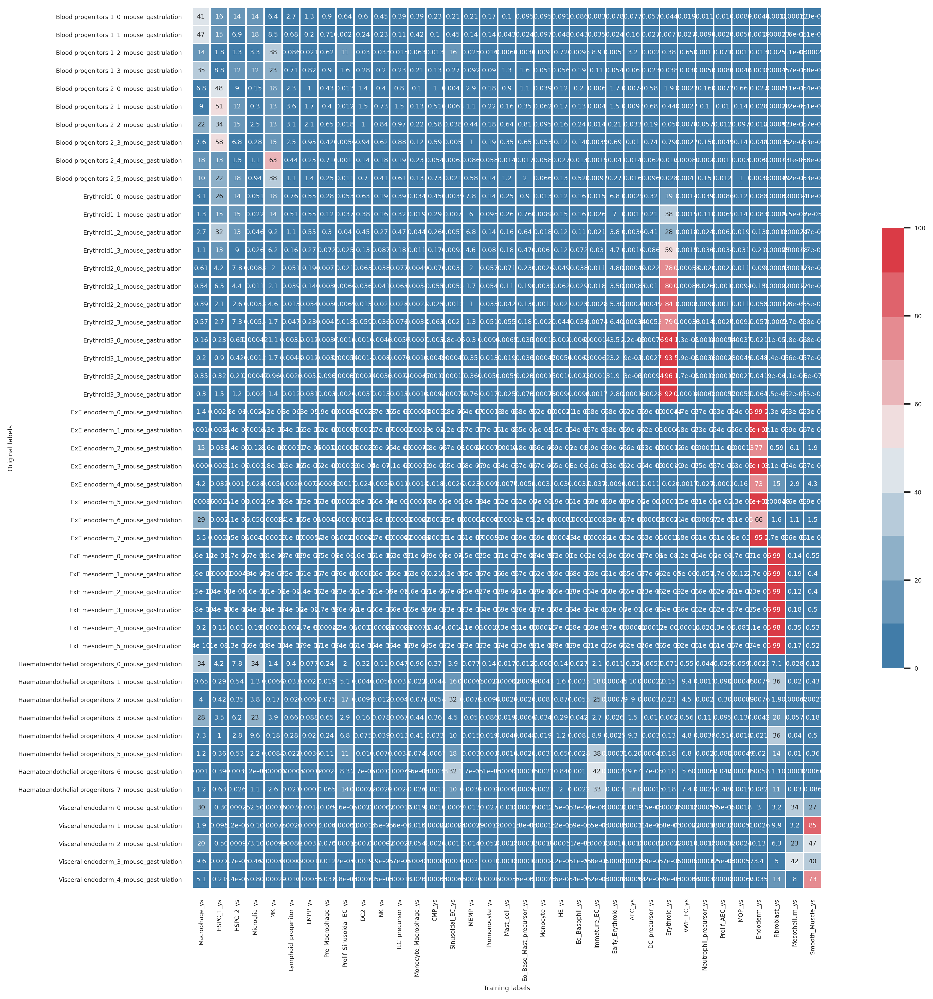

In [89]:
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.5)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})

plt.ylabel("Original labels")
plt.xlabel("Training labels")
plt.savefig('./ver5_lr_model_means_subclusters.pdf',dpi=300)

In [92]:
 # Get aggreagted
key_add = 'orig_labels'
pred_out[key_add] = pred_out[key_add].astype(str)
pred_out[key_add]  = pred_out[key_add].str.replace('_\d+_','_').astype(str)

<ipython-input-92-b8341e8fb115>:4: FutureWarning: The default value of regex will change from True to False in a future version.
  pred_out[key_add]  = pred_out[key_add].str.replace('_\d+_','_').astype(str)


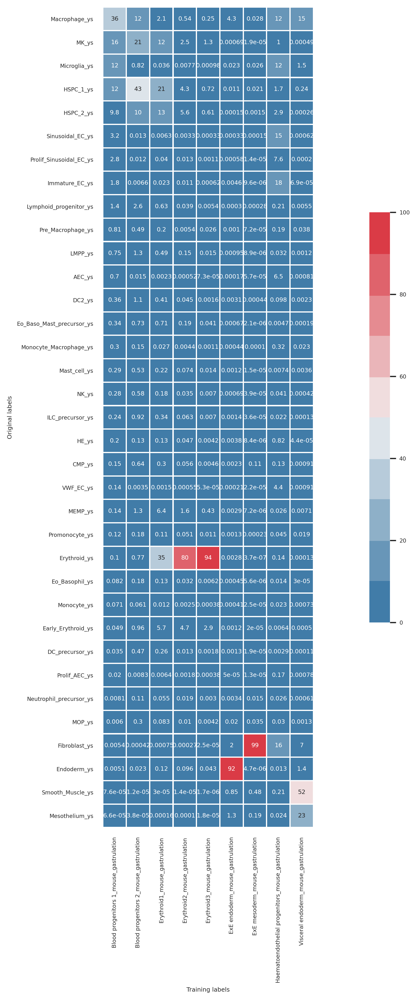

In [94]:
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.5)
crs_tbl = crs_tbl.T
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")
plt.savefig('./ver5_lr_model_means_clusters.pdf',dpi=300)

In [58]:
inverse = pred_out.loc[:, pred_out.columns != 'predicted'].T

In [59]:
inverse.loc[inverse.index != 'orig_labels',: ]

,cell_55,cell_56,cell_58,cell_64,cell_73,cell_82,cell_96,cell_105,cell_107,cell_113,...,cell_139265,cell_139269,cell_139287,cell_139299,cell_139306,cell_139315,cell_139321,cell_139326,cell_139327,cell_139330
AEC_ys,0.0,0.0,0.000001,0.0,0.0,0.000008,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000009,0.0,0.0,0.0,0.0
CMP_ys,0.0,0.0,0.0,0.0,0.0,0.000003,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00009,0.0,0.0,0.000862,0.000028,0.000051,0.000054,0.000018
DC2_ys,0.0,0.0,0.000002,0.000001,0.0,0.000002,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000057,0.0,0.0,0.00039,0.000003,0.000007,0.000006,0.000006
DC_precursor_ys,0.0,0.0,0.000001,0.000017,0.0,0.000038,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000007,0.0,0.0,0.000145,0.000017,0.00002,0.000015,0.000012
Early_Erythroid_ys,0.0,0.0,0.000001,0.000002,0.0,0.000001,0.0,0.0,0.0,0.0,...,0.0,0.0,0.065937,0.0,0.0,0.030852,0.028422,0.016128,0.009736,0.062008
Endoderm_ys,0.999997,0.999998,0.000006,0.000175,0.999989,0.000596,0.999997,0.999999,0.999987,0.999989,...,0.0,0.999986,0.000146,0.0,0.999991,0.000956,0.00015,0.000384,0.000415,0.000098
Eo_Baso_Mast_precursor_ys,0.0,0.0,0.000001,0.000002,0.0,0.00003,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000642,0.000002,0.0,0.003659,0.000468,0.000267,0.000436,0.000182
Eo_Basophil_ys,0.0,0.0,0.000001,0.000002,0.0,0.000005,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000168,0.0,0.0,0.000431,0.000037,0.000108,0.000068,0.000047
Erythroid_ys,0.0,0.0,0.0,0.0,0.0,0.000014,0.0,0.0,0.0,0.0,...,0.0,0.0,0.897764,0.0,0.0,0.712399,0.941533,0.957505,0.958805,0.920541
Fibroblast_ys,0.0,0.0,0.7187,0.220816,0.0,0.085654,0.0,0.0,0.0,0.000001,...,0.996153,0.0,0.0,0.0,0.0,0.000003,0.0,0.0,0.0,0.0


In [60]:
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()

In [61]:
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()

In [62]:
model_mean_probs*100

,AEC_ys,CMP_ys,DC2_ys,DC_precursor_ys,Early_Erythroid_ys,Endoderm_ys,Eo_Baso_Mast_precursor_ys,Eo_Basophil_ys,Erythroid_ys,Fibroblast_ys,...,Monocyte_ys,NK_ys,Neutrophil_precursor_ys,Pre_Macrophage_ys,Prolif_AEC_ys,Prolif_Sinusoidal_EC_ys,Promonocyte_ys,Sinusoidal_EC_ys,Smooth_Muscle_ys,VWF_EC_ys
orig_labels,,,,,,,,,,,,,,,,,,,,,
Blood progenitors 1_mouse_gastrulation,5.535199e-02,2.029101e-02,6.966776e-02,1.181727e-03,1.209272e-02,5.647849e-04,4.156005e-03,3.144083e-02,2.837784e-03,0.000032,...,1.607821e-02,3.008293e-02,3.347961e-03,3.160906e-01,2.171488e-03,6.704574e-04,7.293884e-02,1.082376e-01,1.356958e-07,6.865296e-03
Blood progenitors 2_mouse_gastrulation,6.728162e-03,2.507452e-01,5.770174e-01,2.124173e-01,2.854879e-01,9.257344e-03,3.165520e-02,2.839358e-02,7.790647e-02,0.000098,...,3.006383e-02,4.183241e-01,6.465954e-03,1.488549e-01,3.625711e-03,3.049489e-03,1.077503e-01,3.904487e-03,2.988307e-06,1.796562e-03
Erythroid1_mouse_gastrulation,1.010609e-03,1.593810e-01,1.617973e-01,1.311874e-02,3.455102e+00,5.910884e-02,3.633605e-01,5.968796e-02,3.678414e+01,0.000319,...,4.415540e-03,6.666422e-02,1.709292e-02,8.750696e-03,3.152916e-03,1.829718e-02,7.208888e-02,2.585526e-03,1.042306e-05,1.008948e-03
Erythroid2_mouse_gastrulation,3.106539e-04,3.371262e-02,2.035779e-02,4.630009e-03,3.604078e+00,5.554807e-02,1.404397e-01,2.481423e-02,8.253535e+01,0.000098,...,1.585231e-03,2.640540e-02,1.263904e-02,3.132798e-03,1.135689e-03,6.231669e-03,4.022400e-02,1.645949e-03,4.124516e-06,2.815776e-04
Erythroid3_mouse_gastrulation,3.075140e-05,2.413220e-03,4.810099e-04,8.964538e-04,2.162484e+00,2.279223e-02,2.904680e-02,4.313165e-03,9.481274e+01,0.000006,...,1.951045e-04,4.614561e-03,1.607342e-03,2.391810e-03,2.088811e-04,3.912305e-04,8.004471e-03,9.533281e-05,2.881379e-07,1.579722e-05
ExE endoderm_mouse_gastrulation,2.357645e-06,1.857151e-05,2.574584e-05,1.054293e-05,8.534682e-07,9.999741e+01,2.043388e-06,2.487269e-06,9.461545e-05,0.000006,...,2.880602e-06,2.907835e-07,9.423968e-06,2.229585e-07,2.207458e-06,4.839530e-05,3.363160e-05,1.080668e-06,7.086195e-08,2.496574e-07
ExE mesoderm_mouse_gastrulation,2.247500e-07,3.410318e-07,3.873040e-07,5.297694e-07,5.916695e-07,5.872654e-07,1.889624e-07,7.252701e-07,1.653151e-09,99.628822,...,7.208724e-07,1.048776e-06,8.106209e-07,4.022610e-08,9.996958e-08,5.243372e-08,2.742339e-07,9.925082e-08,2.275019e-01,6.627369e-07
Haematoendothelial progenitors_mouse_gastrulation,2.197917e-01,9.346920e-04,1.008199e-05,8.277880e-05,2.510159e-04,7.398733e-04,9.828852e-04,1.805002e-03,1.063185e-02,0.101852,...,2.522989e-03,1.829598e-03,1.320769e-03,1.701001e-03,2.458586e-03,1.316114e-01,6.779276e-05,1.816743e+00,2.170634e-04,1.816396e-01
Visceral endoderm_mouse_gastrulation,4.916755e-06,6.512411e-06,2.077939e-06,8.640083e-06,1.169495e-05,4.969870e-04,1.128899e-05,3.337322e-06,9.750360e-08,0.789669,...,1.058933e-05,6.011033e-06,3.996460e-05,1.142385e-06,2.391770e-06,1.629828e-06,1.294790e-05,6.756127e-07,7.606469e+01,1.820128e-05


/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Text(0.5, 291.10937500000006, 'Training labels')

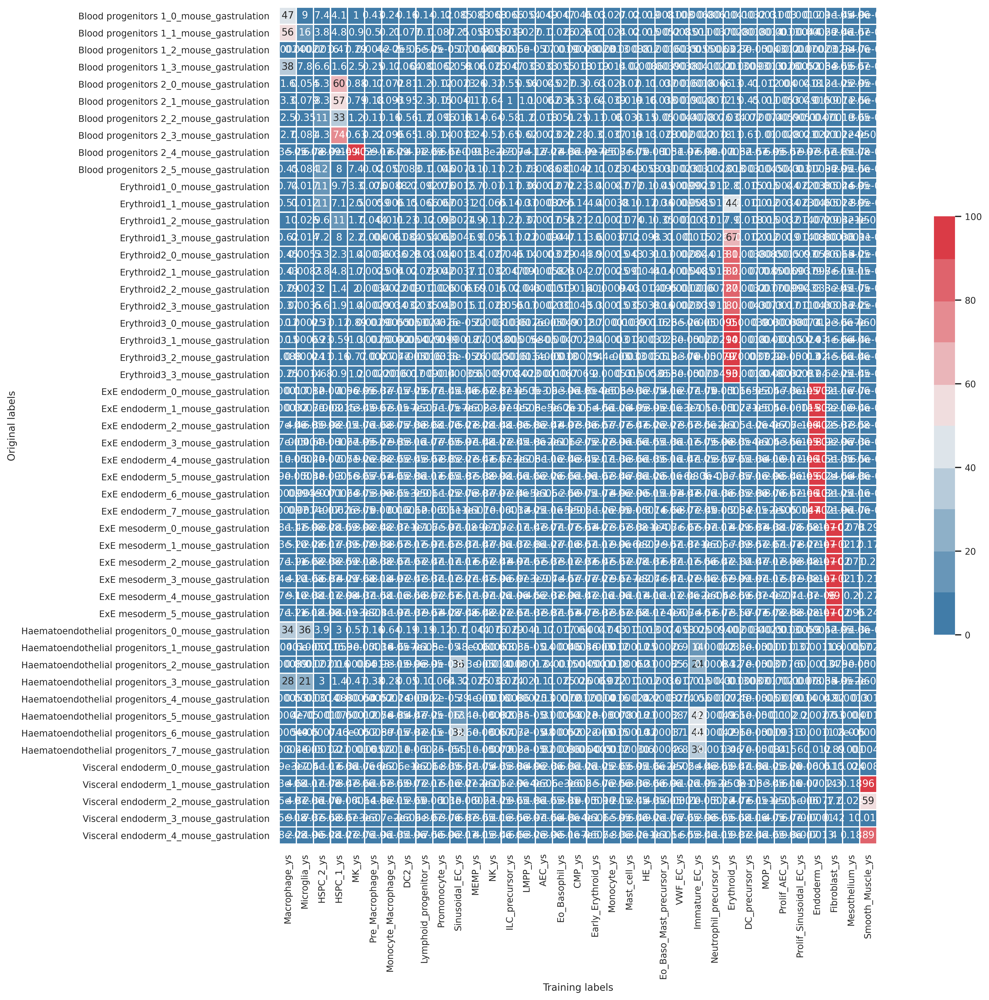

In [63]:


train_label = adata.obs[common_cat].values
predict_label = train_label[subset_predict]

X, y = load_iris(return_X_y=True)
clf = LogisticRegression(random_state=0).fit(X, y)
clf.predict(X[:2, :])
clf.score(X, y)

pred_out = pd.DataFrame(model.predict(predict_x),columns = ['predicted'],index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out['orig_labels'] = predict_label
proba = pd.DataFrame(model.predict_proba(predict_x),columns = lr.classes_,index = adata.obs.index[adata.obs[common_cat].isin(group2)])
pred_out = pred_out.join(proba)
pred_out

model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').mean()
model_mean_probs = pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels').median()
model_mean_probs = model_mean_probs*100
model_mean_probs = model_mean_probs.dropna(axis=0, how='any', thresh=None, subset=None, inplace=False)
crs_tbl = model_mean_probs.copy()
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

In [64]:
crs_tbl = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/med_lr_probs.csv',index_col=0)

Text(0.5, 635.5639204545454, 'Training labels')

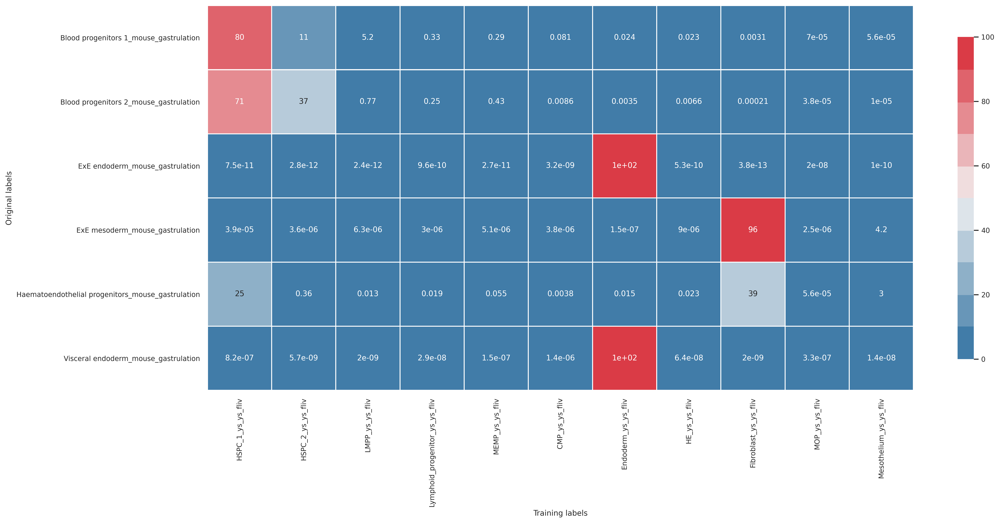

In [65]:
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal,  annot=True,vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.ylabel("Original labels")
plt.xlabel("Training labels")

In [66]:
pred_out.loc[:, pred_out.columns != 'predicted'].groupby('orig_labels')

In [67]:
crs_tbl.to_csv('./med_lr_probs.csv')

# Model Coefficients
- https://www.datasklr.com/logistic-regression/multinomial-logistic-regression
-The interpretation of the exponentiated coefficients is for a single unit change in the predictor variable, the odds will be multiplied by a factor indicated by the exponent of the beta coefficient, given that all other variables are held constant.  For example, the first variable is LENGTH with a value of 0.038.  This means  that if length increases by one unit the odds of being female is 3.8% compared to the status when length did not increase by one unit. A generic output looks looks something like this (the below is based on infants!)

# Get Model prediction output ranked genes
# Add PC coeff as well
-Standardized coefficients represent the mean change in the response given a one standard deviation change in the predictor.

- plotting multinomial lr https://scikit-learn.org/dev/auto_examples/linear_model/plot_logistic_multinomial.html

In [68]:
# Export top genes for each PC loading
coeff = pd.DataFrame(model.coef_,index = lr.classes_)
df_loadings = pd.DataFrame(adata.varm['PCs'], index=adata.var_names)
df_rankings = pd.DataFrame((-1 * df_loadings.values).argsort(0).argsort(0), index=df_loadings.index, columns=df_loadings.columns)
coeff_rankings = (pd.DataFrame((-1 * coeff.T.values).argsort(0).argsort(0), index=coeff.T.index, columns=coeff.T.columns)).T

# get top loadings for each classification
# Use Cumulative distribution to determine feature importance
ranking_genes = pd.DataFrame(columns = ['class','x_pc','top_loadings','loading_val'])
for classes in coeff_rankings.index:
    print(classes)
    class_ranking = pd.DataFrame(coeff_rankings.T.loc[: , classes])
    class_ranking = class_ranking.iloc[:,0].sort_values().head(3)
    for comps in class_ranking.index:
        print(comps)
        genes = list(df_rankings[comps].sort_values().head(15).index)
        compile_classes = pd.DataFrame(columns = ranking_genes.columns)
        compile_classes.top_loadings = genes
        compile_classes.x_pc = comps
        compile_classes['class'] = classes
        compile_classes['loading_val'] = df_loadings.loc[df_loadings.index.isin(genes),comps].sort_values(ascending=False).values
        ranking_genes = pd.concat([ranking_genes,compile_classes])
        U = np.mean(df_loadings[comps])
        std = np.std(df_loadings[comps])
        med =  np.median(df_loadings[comps])
        mad = np.median(np.absolute(df_loadings[comps] - np.median(df_loadings[comps])))
        pvals = scipy.stats.norm.sf(df_loadings[comps], loc=U, scale=1*std)
        pvals = scipy.stats.norm.sf(df_loadings[comps], loc=med, scale=2*mad)
        df_loadings[str(comps) +'_pval'] = pvals

ranking_genes.to_csv('lr_features_sig.csv')
#plt.plot(coeff.iloc[0,:], coeff.iloc[0,:] + 0, '-g')
#plt.axvline(x=-0.36914894,color='blue')
#plt.axvline(x=-0.36914894,color='blue')

AEC_ys
13
1
2
CMP_ys
32
30
27
DC2_ys
41
4
10
DC_precursor_ys
11
22
21
Early_Erythroid_ys
52
79
42
Endoderm_ys
3
28
43
Eo_Baso_Mast_precursor_ys
25
19
6
Eo_Basophil_ys
25
26
19
Erythroid_ys
6
2
14
Fibroblast_ys
0
5
14
HE_ys
2
13
97
HSPC_1_ys
11
1
20
HSPC_2_ys
10
20
31
ILC_precursor_ys
23
10
11
Immature_EC_ys
2
16
24
LMPP_ys
10
36
29
Lymphoid_progenitor_ys
23
22
10
MEMP_ys
60
6
12
MK_ys
7
62
5
MOP_ys
32
6
27
Macrophage_ys
1
6
22
Mast_cell_ys
25
6
51
Mesothelium_ys
9
0
17
Microglia_ys
1
3
21
Monocyte_Macrophage_ys
16
3
33
Monocyte_ys
24
16
18
NK_ys
38
90
22
Neutrophil_precursor_ys
36
25
32
Pre_Macrophage_ys
15
23
1
Prolif_AEC_ys
13
10
7
Prolif_Sinusoidal_EC_ys
2
10
40
Promonocyte_ys
15
14
54
Sinusoidal_EC_ys
2
16
1
Smooth_Muscle_ys
0
5
14
VWF_EC_ys
20
16
2


In [69]:
ranking_genes

,class,x_pc,top_loadings,loading_val
0,AEC_ys,13,GJA5,0.254285
1,AEC_ys,13,IL33,0.232750
2,AEC_ys,13,TMEM100,0.204895
3,AEC_ys,13,GJA4,0.153486
4,AEC_ys,13,CLEC14A,0.136381
...,...,...,...,...
10,VWF_EC_ys,2,PECAM1,0.097085
11,VWF_EC_ys,2,APLNR,0.096024
12,VWF_EC_ys,2,CD93,0.094238
13,VWF_EC_ys,2,ADGRL4,0.092574


# Plot these genes

In [70]:
pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])

,class,x_pc,top_loadings,loading_val
0,AEC_ys,13,GJA5,0.254285
1,AEC_ys,13,IL33,0.232750
2,AEC_ys,13,TMEM100,0.204895
0,AEC_ys,1,AIF1,0.078790
1,AEC_ys,1,LAPTM5,0.078590
...,...,...,...,...
13,VWF_EC_ys,16,AREG,0.070373
14,VWF_EC_ys,16,UPP1,0.069793
12,VWF_EC_ys,2,CD93,0.094238
13,VWF_EC_ys,2,ADGRL4,0.092574


In [71]:
ranking_genes.groupby(['class','x_pc']).head(5)
ranking_genes.groupby(['class','x_pc']).tail(5)

,class,x_pc,top_loadings,loading_val
10,AEC_ys,13,LTBP4,0.106285
11,AEC_ys,13,EMP1,0.094575
12,AEC_ys,13,EFNB2,0.092828
13,AEC_ys,13,SLC1A4,0.091128
14,AEC_ys,13,AQP1,0.087766
...,...,...,...,...
10,VWF_EC_ys,2,PECAM1,0.097085
11,VWF_EC_ys,2,APLNR,0.096024
12,VWF_EC_ys,2,CD93,0.094238
13,VWF_EC_ys,2,ADGRL4,0.092574


In [72]:
rank = pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])
plot_genes =  rank.groupby(['class'])['top_loadings'].agg(lambda grp: list(grp)).to_dict()

In [73]:
rank = pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])
plot_genes =  rank.groupby(['class'])['top_loadings'].agg(lambda grp: list(grp)).to_dict()
predict_grp = adata[adata.obs[common_cat].isin(group1)]
counts = (pd.DataFrame(predict_grp.obs['corr_concat'].value_counts()))
#predict_grp = predict_grp[predict_grp.obs.index.isin(predict_grp.obs.groupby('predicted').head(100).index)]
sc.pl.tracksplot(predict_grp, plot_genes, groupby='corr_concat', dendrogram=True,save = 'trackspot')

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_corr_concat']`


Trying to set attribute `.uns` of view, copying.


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f45104d6ca0> (for post_execute):


KeyboardInterrupt: 

In [ ]:
rank = pd.concat([ranking_genes.groupby(['class','x_pc']).head(3),ranking_genes.groupby(['class','x_pc']).tail(3)])
plot_genes =  rank.groupby(['class'])['top_loadings'].agg(lambda grp: list(grp)).to_dict()

In [ ]:
predict_grp = adata[adata.obs[common_cat].isin(group2)]
counts = (pd.DataFrame(predict_grp.obs['predicted'].value_counts()))
#predict_grp = predict_grp[predict_grp.obs.index.isin(predict_grp.obs.groupby('predicted').head(100).index)]
sc.pl.tracksplot(predict_grp, plot_genes, groupby='corr_concat', dendrogram=True,save = 'trackspot')

In [ ]:
ranking_genes.to_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/lr_sig_feature_usage.csv')

# Get genes conserved between species and differential expression within combined embedding for single classes of cells

In [ ]:
# Get conserved expression
save = 'endoderm_mouse_human_conserved.csv'
celltypes = ['ExE endoderm_4_mouse_gastrulation','Endoderm_ys']
celltype_rank = ranking_genes[ranking_genes['class'].isin(celltypes)]
celltype_rank.columns = ['cluster','xpca','gene','logfc']
celltype_rank.to_csv(save)

In [ ]:
celltype_rank

In [ ]:
adata.obs['species']

In [ ]:
# Get differential
key_add = 'de_unclust'
adata.obs[key_add] = adata.obs['corr_concat'].astype(str)
adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add]  = adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add].str.replace('_\d+_','_').astype(str)
list(adata.obs.loc[adata.obs['species'].isin(['Mouse']),key_add].unique())

In [ ]:
keep_classes = ['ExE endoderm_mouse_gastrulation','Endoderm_ys']
adata_deg = adata[adata.obs[key_add].isin(keep_classes)]

sc.tl.rank_genes_groups(adata_deg, key_add, method='wilcoxon',groups=keep_classes,n_genes=500)
sc.pl.rank_genes_groups(adata_deg, n_genes=50, sharey=False)

result = adata_deg.uns['rank_genes_groups']
groups = result['names'].dtype.names
    
DE = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']}).head(500)

DE_name ="./mouse_human_endoderm"
DE.to_csv(DE_name)

103


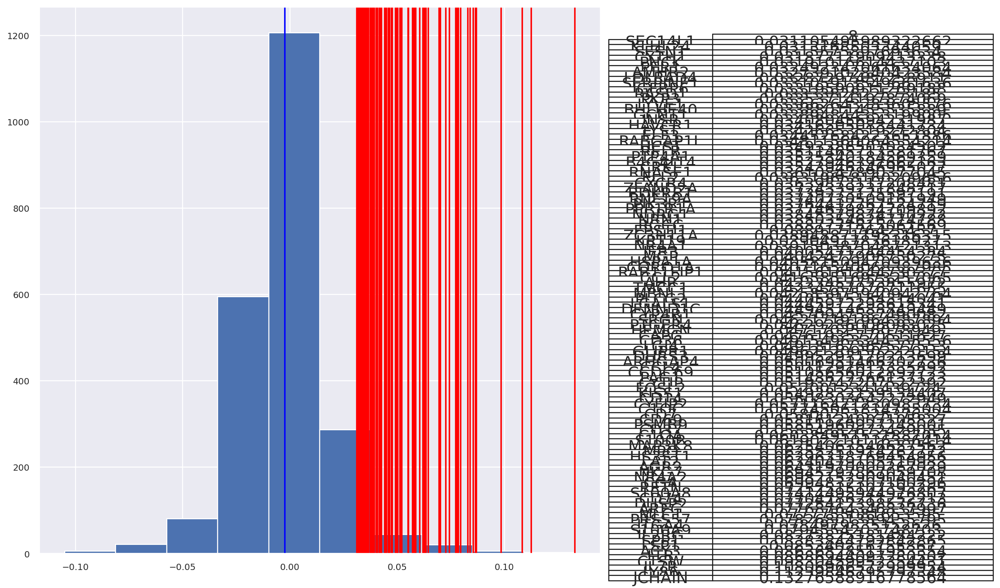

In [40]:
U = np.mean(df_loadings[comps])
std = np.std(df_loadings[comps])
med =  np.median(df_loadings[comps])
mad = np.median(np.absolute(df_loadings[comps] - np.median(df_loadings[comps])))
pvals = scipy.stats.norm.sf(df_loadings[comps], loc=med, scale=2*mad)
#pvals = scipy.stats.norm.sf(df_loadings[comps], loc=U, scale=1*std)
df_loadings[str(comps) +'_pval'] = pvals
plt.hist(df_loadings[comps])
for i in ((df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]).unique()):
    plt.axvline(x=i,color='red')
plt.axvline(x=med,color='blue')
#plt.axvline(x=med,color='pink')
df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]
print(len(df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]))
#Plot precision recall and recall
plot_loading = pd.DataFrame(pd.DataFrame(df_loadings[comps][df_loadings[str(comps) +'_pval']<0.05]).iloc[:,0].sort_values())
table = plt.table(cellText=plot_loading.values,colWidths = [1]*len(plot_loading.columns),
rowLabels=plot_loading.index,
colLabels=plot_loading.columns,
cellLoc = 'center', rowLoc = 'center',
loc='right', bbox=[1.2, -0.05, 0.5,1])
table.scale(1, 2)
table.set_fontsize(16)

In [41]:
# make 3-class dataset for classification
centers = [[-5, 0], [0, 1.5], [5, -1]]
X, y = make_blobs(n_samples=1000, centers=centers, random_state=40)
transformation = [[0.4, 0.2], [-0.4, 1.2]]
X = np.dot(X, transformation)

NameError: name 'make_blobs' is not defined

# Marker gene overlap to rank conserved genes

### Calculate an overlap score between data-deriven marker genes and provided markers 
### Marker gene overlap scores can be quoted as overlap counts, overlap coefficients, or jaccard indices. The method returns a pandas dataframe which can be used to annotate clusters based on marker gene overlaps.

In [ ]:
# Grab marker genes that overlap between top gene loadings in each PCA used for predictions

In [ ]:
scanpy.tl.marker_gene_overlap(adata, reference_markers, *, key='rank_genes_groups', method='overlap_count', normalize=None, top_n_markers=None, adj_pval_threshold=None, key_added='marker_gene_overlap', inplace=False)

# Regress out effect of gene predictions dervied from PCA

In [ ]:
dc_class = ranking_genes[ranking_genes['class'].isin(['DC_YS_main_training'])]

pca = pd.DataFrame(adata.obsm['X_pca'])
regress_ind = list(dc_class['x_pc'].unique())
regress_ind_obs = pca[regress_ind]
regress_ind = ['regress-pc_' + str(s) for s in regress_ind]
regress_ind_obs.columns = regress_ind
adata.obs[regress_ind] = regress_ind_obs.values
adata.obs[regress_ind]
sc.pp.regress_out(adata,keys = regress_ind)

In [ ]:
print(__doc__)

import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.linear_model import LogisticRegression

# make 3-class dataset for classification
#centers = [[-5, 0], [0, 1.5], [5, -1]]
#X, y = make_blobs(n_samples=1000, centers=centers, random_state=40)
#transformation = [[0.4, 0.2], [-0.4, 1.2]]
#X = np.dot(X, transformation)
# make 3-class dataset for classification
centers = [[-5, 0], [0, 1.5], [5, -1]]
X, y = make_blobs(n_samples=1000, centers=centers, random_state=40)
transformation = [[0.4, 0.2], [-0.4, 1.2]]
X = np.dot(X, transformation)

for multi_class in ('multinomial', 'ovr'):
    clf = LogisticRegression(solver='sag', max_iter=100, random_state=42,
                             multi_class=multi_class).fit(X, y)

    # print the training scores
    print("training score : %.3f (%s)" % (clf.score(X, y), multi_class))

    # create a mesh to plot in
    h = .02  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.contourf(xx, yy, Z, cmap=plt.cm.Paired)
    plt.title("Decision surface of LogisticRegression (%s)" % multi_class)
    plt.axis('tight')

    # Plot also the training points
    colors = "bry"
    for i, color in zip(clf.classes_, colors):
        idx = np.where(y == i)
        plt.scatter(X[idx, 0], X[idx, 1], c=color, cmap=plt.cm.Paired,
                    edgecolor='black', s=20)

    # Plot the three one-against-all classifiers
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    coef = clf.coef_
    intercept = clf.intercept_

    def plot_hyperplane(c, color):
        def line(x0):
            return (-(x0 * coef[c, 0]) - intercept[c]) / coef[c, 1]
        plt.plot([xmin, xmax], [line(xmin), line(xmax)],
                 ls="--", color=color)

    for i, color in zip(clf.classes_, colors):
        plot_hyperplane(i, color)

plt.show()

In [ ]:
pred_out.sum(axis=1)

In [ ]:
pred_out

# LR classification probability

In [70]:
crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)

,HSPC_1_ys_ys_fliv,HSPC_2_ys_ys_fliv,LMPP_ys_ys_fliv,Lymphoid_progenitor_ys_ys_fliv,MEMP_ys_ys_fliv,CMP_ys_ys_fliv,Endoderm_ys_ys_fliv,HE_ys_ys_fliv,Fibroblast_ys_ys_fliv,MOP_ys_ys_fliv,Mesothelium_ys_ys_fliv
orig_labels,,,,,,,,,,,
Blood progenitors 1_mouse_gastrulation,7.290554e+01,1.930453e+01,5.180441e+00,3.334478e-01,2.854320e-01,8.101407e-02,2.371309e-02,2.284334e-02,3.070007e-03,6.972821e-05,5.578531e-05
Blood progenitors 2_mouse_gastrulation,8.777159e+01,9.892953e+00,7.723107e-01,2.516013e-01,4.339221e-01,8.567539e-03,3.463908e-03,6.605082e-03,2.141145e-04,3.790568e-05,1.039372e-05
ExE endoderm_mouse_gastrulation,7.473169e-11,2.783183e-12,2.404855e-12,9.633614e-10,2.734227e-11,3.188179e-09,1.000000e+02,5.332775e-10,3.764083e-13,1.962548e-08,9.996105e-11
ExE mesoderm_mouse_gastrulation,3.885362e-05,3.590736e-06,6.302726e-06,3.006847e-06,5.121347e-06,3.809947e-06,1.502038e-07,8.989921e-06,9.582037e+01,2.485449e-06,4.179589e+00
Haematoendothelial progenitors_mouse_gastrulation,7.859151e+00,3.564206e-01,1.319820e-02,1.880002e-02,5.465652e-02,3.757975e-03,1.530784e-02,2.313108e-02,3.874973e+01,5.578971e-05,3.024178e+00
Visceral endoderm_mouse_gastrulation,8.219498e-07,5.648369e-09,1.983925e-09,2.900750e-08,1.523854e-07,1.359970e-06,1.000000e+02,6.368056e-08,1.983644e-09,3.281215e-07,1.362701e-08


In [71]:
crs_tbl

,HSPC_1_ys_ys_fliv,HSPC_2_ys_ys_fliv,LMPP_ys_ys_fliv,Lymphoid_progenitor_ys_ys_fliv,MEMP_ys_ys_fliv,CMP_ys_ys_fliv,Endoderm_ys_ys_fliv,HE_ys_ys_fliv,Fibroblast_ys_ys_fliv,MOP_ys_ys_fliv,Mesothelium_ys_ys_fliv
orig_labels,,,,,,,,,,,
Blood progenitors 1_mouse_gastrulation,7.290554e+01,1.930453e+01,5.180441e+00,3.334478e-01,2.854320e-01,8.101407e-02,2.371309e-02,2.284334e-02,3.070007e-03,6.972821e-05,5.578531e-05
Blood progenitors 2_mouse_gastrulation,8.777159e+01,9.892953e+00,7.723107e-01,2.516013e-01,4.339221e-01,8.567539e-03,3.463908e-03,6.605082e-03,2.141145e-04,3.790568e-05,1.039372e-05
ExE endoderm_mouse_gastrulation,7.473169e-11,2.783183e-12,2.404855e-12,9.633614e-10,2.734227e-11,3.188179e-09,1.000000e+02,5.332775e-10,3.764083e-13,1.962548e-08,9.996105e-11
ExE mesoderm_mouse_gastrulation,3.885362e-05,3.590736e-06,6.302726e-06,3.006847e-06,5.121347e-06,3.809947e-06,1.502038e-07,8.989921e-06,9.582037e+01,2.485449e-06,4.179589e+00
Haematoendothelial progenitors_mouse_gastrulation,7.859151e+00,3.564206e-01,1.319820e-02,1.880002e-02,5.465652e-02,3.757975e-03,1.530784e-02,2.313108e-02,3.874973e+01,5.578971e-05,3.024178e+00
Visceral endoderm_mouse_gastrulation,8.219498e-07,5.648369e-09,1.983925e-09,2.900750e-08,1.523854e-07,1.359970e-06,1.000000e+02,6.368056e-08,1.983644e-09,3.281215e-07,1.362701e-08


Text(652.4937500000001, 0.5, 'Predicted labels')

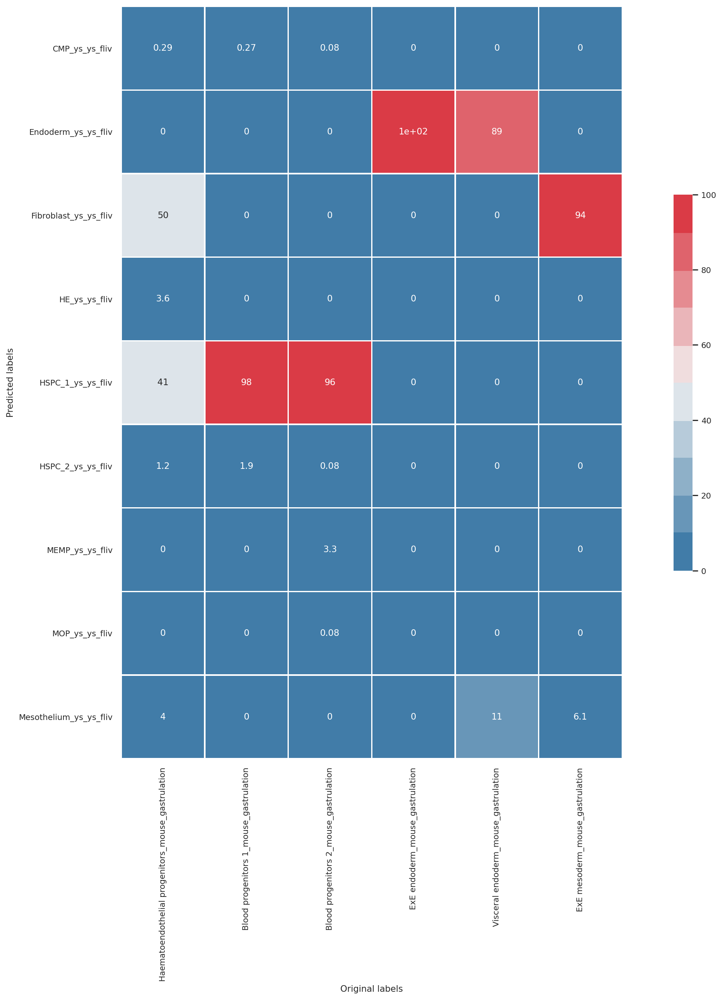

In [72]:
x = 'predicted'
y = common_cat

y_attr = adata.obs[y]
x_attr = adata.obs[x]
crs = pd.crosstab(x_attr, y_attr)
crs_tbl = crs
for col in crs_tbl :
    crs_tbl[col] = crs_tbl[col].div(crs_tbl[col].sum(axis=0)).multiply(100).round(2)
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0,annot=True, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")

In [74]:
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt
cm = confusion_matrix(predict_label, model.predict(predict_x))
#cm = confusion_matrix(train_label, model.predict_proba(train_x))
df_cm = pd.DataFrame(cm, index = np.unique(predict_label),
                  columns = lr.classes_)
df_cm = (df_cm / df_cm.sum(axis=0))*100
plt.figure(figsize = (20,15))
sn.set(font_scale=1) # for label size
pal = sns.diverging_palette(240, 10, n=10)
plt.suptitle(('Mean Accuracy: %.3f std: %.3f' % (np.mean(n_scores),  np.std(n_scores))), y=1.05, fontsize=18)
sn.heatmap(df_cm, annot=True, annot_kws={"size": 16},cmap=pal) # font size

ValueError: Shape of passed values is (15, 15), indices imply (6, 11)

In [ ]:
train_label

In [ ]:
df_proba = pd.DataFrame(model.predict_proba(train_x),columns = lr.classes_)
df_proba.index = train_label
(df_proba*100)

In [75]:
lr = LR_compare(adata, train_x, train_label, subset_predict, subset_train, sparcity=sparcity, col_name='predicted')

################################################################################################################################################################
#HTML cross-table construction

# Plotting purposes - Subset data to only contain prediction data with new predicted labelså
# Make adata the predicted data with projected annotations in adata.obs["predicted"]. "corr_concat" contains old 
# cell.labels and dataset name combined 
common_cat = "corr_concat"
adata_concat = adata[:]
adata = adata[adata.obs["predicted"].isin(group1)]
adata = adata[adata.obs["corr_concat"].isin(group2)]

# The results, are displayed in a python notebook or rendered as a html (just for quick visualisation, not saving)
# This table represents probability (binary cell type assignment) - numbers represent number of cells
# Columns contain number of original cells from adata2 that are now labelled using the training dataset, adata1
# (as shown on y axis)
crs_tbl = cross_table(adata, x = 'predicted', y = common_cat, highlight = True)
#crs_tbl

################################################################################################################################################################
# Heatmap function

x = 'predicted'
y = common_cat

y_attr = adata.obs[y]
x_attr = adata.obs[x]
crs = pd.crosstab(x_attr, y_attr)
crs_tbl = crs
for col in crs_tbl :
    crs_tbl[col] = crs_tbl[col].div(crs_tbl[col].sum(axis=0)).multiply(100).round(2)
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")
#plt.savefig(save_path + "/LR_predictions.pdf")
#crs_tbl.to_csv(save_path + "/pre-freq_LR_predictions_supp_table.csv")

<ipython-input-14-9b85cedef5b3>:26: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if train_x == 'X':


TypeError: unhashable type: 'numpy.ndarray'

In [20]:
lr

LogisticRegression(C=0.2, l1_ratio=0.5, max_iter=200, multi_class='multinomial',
                   penalty='elasticnet', solver='saga')

In [ ]:
model = lr.fit(train_x, train_label)
lr.fit(train_x, train_label)

# Model evaluation:

In [64]:
model = lr.fit(train_x, train_label)
lr.fit(train_x, train_label)

NameError: name 'lr' is not defined

# Tuned penalty function:

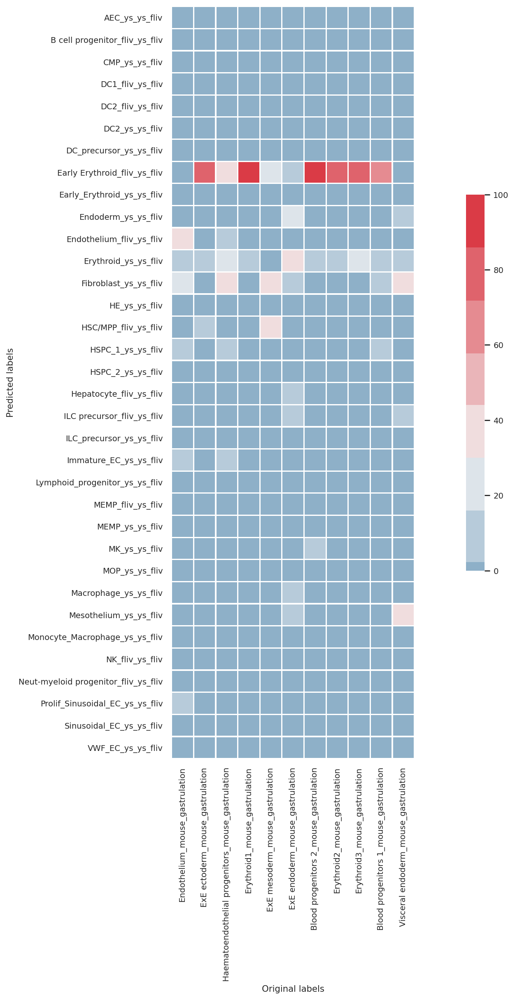

In [53]:
x = 'predicted'
y = common_cat

y_attr = adata.obs[y]
x_attr = adata.obs[x]
crs = pd.crosstab(x_attr, y_attr)
crs_tbl = crs
for col in crs_tbl :
    crs_tbl[col] = crs_tbl[col].div(crs_tbl[col].sum(axis=0)).multiply(100).round(2)
# Sort df columns by rows
crs_tbl = crs_tbl.sort_values(by =list(crs_tbl.index), axis=1,ascending=False)
# Plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0, vmax=100, linewidths=1, center=30, square=True, cbar_kws={"shrink": 0.5})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")
plt.savefig(save_path + "/LR_predictions.pdf")
crs_tbl.to_csv(save_path + "/pre-freq_LR_predictions_supp_table.csv")

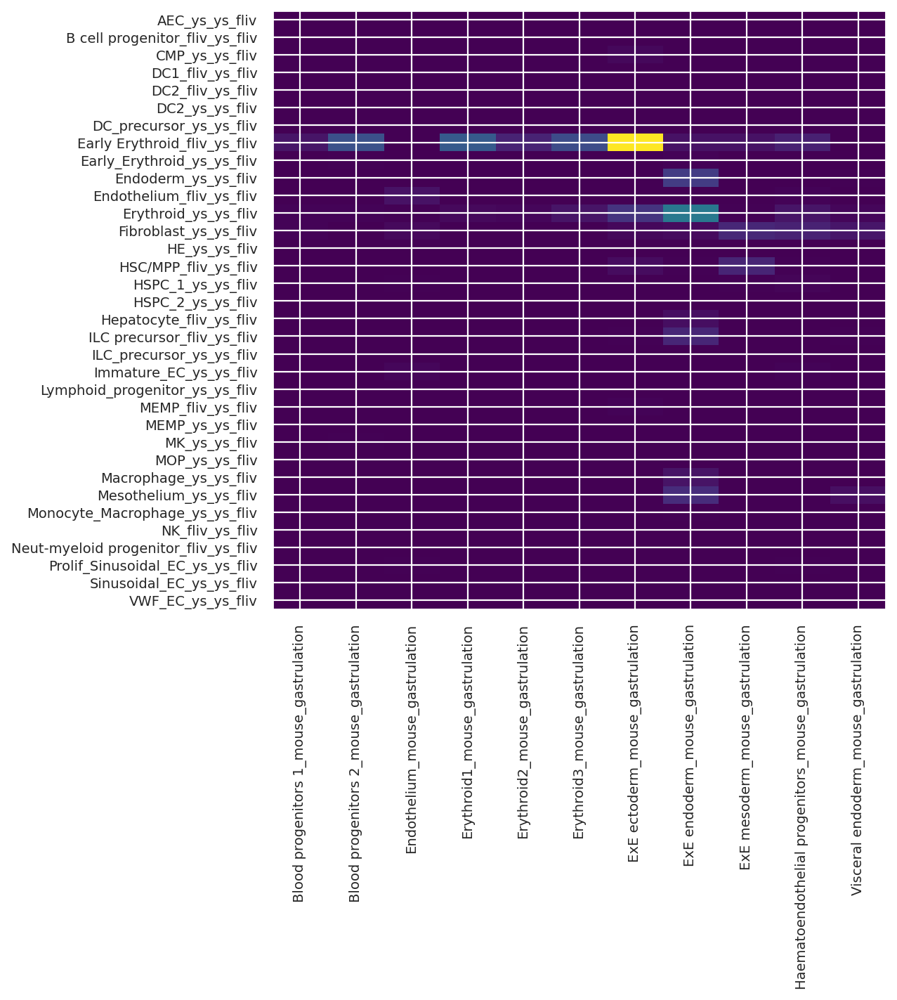

In [56]:
def plot_df_heatmap(df, cmap='viridis', title=None, figsize=(7, 7), rotation=90, save=None, **kwargs):
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(df, cmap=cmap, aspect='auto', **kwargs)
    if 0 < rotation < 90:
        horizontalalignment = 'right'
    else:
        horizontalalignment = 'center'
    plt.xticks(
        range(len(df.columns)),
        df.columns,
        rotation=rotation,
        horizontalalignment=horizontalalignment,
    )
    plt.yticks(range(len(df.index)), df.index)
    if title:
        fig.suptitle(title)
    #fig.colorbar(im)
    if save:
        plt.savefig(fname=save, bbox_inches='tight', pad_inches=0.1)
crs = pd.crosstab(x_attr, y_attr)        
plot_df_heatmap(crs)

In [18]:
crs_tbl = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/mouse_gastrulation_human_YS_combination/mous_human_pre-freq_LR_predictions_supp_table.csv',index_col=0)

In [19]:
crs_tbl.T

predicted,AEC_ys_ys_fliv,B cell progenitor_fliv_ys_fliv,CMP_ys_ys_fliv,DC1_fliv_ys_fliv,DC2_fliv_ys_fliv,DC2_ys_ys_fliv,DC_precursor_ys_ys_fliv,Early Erythroid_fliv_ys_fliv,Early_Erythroid_ys_ys_fliv,Endoderm_ys_ys_fliv,...,MK_ys_ys_fliv,MOP_ys_ys_fliv,Macrophage_ys_ys_fliv,Mesothelium_ys_ys_fliv,Monocyte_Macrophage_ys_ys_fliv,NK_fliv_ys_fliv,Neut-myeloid progenitor_fliv_ys_fliv,Prolif_Sinusoidal_EC_ys_ys_fliv,Sinusoidal_EC_ys_ys_fliv,VWF_EC_ys_ys_fliv
Endothelium_mouse_gastrulation,2.03,0.00,0.00,0.00,0.00,0.00,0.00,1.48,0.00,0.00,...,0.00,0.0,0.55,0.00,0.00,0.00,0.00,30.00,1.29,0.92
ExE ectoderm_mouse_gastrulation,0.00,0.12,1.67,0.07,0.00,0.12,0.07,79.28,0.24,0.00,...,0.02,0.2,0.12,0.14,0.00,0.00,0.05,0.00,0.00,0.00
Haematoendothelial progenitors_mouse_gastrulation,0.00,0.07,0.00,0.00,0.00,0.00,0.00,31.48,31.48,0.00,...,0.00,0.0,0.15,0.00,0.00,0.00,0.00,1.61,0.00,0.22
Erythroid1_mouse_gastrulation,0.00,0.00,0.00,0.00,0.07,0.07,0.00,89.82,89.82,0.00,...,0.41,0.0,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ExE mesoderm_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.16,0.00,17.65,0.31,0.00,...,0.00,0.0,0.00,36.86,0.00,0.00,0.00,0.00,0.00,0.00
ExE endoderm_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.04,0.00,5.03,1.05,47.85,...,0.00,0.0,5.07,12.51,0.51,0.00,0.09,0.00,0.00,0.00
Blood progenitors 2_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.47,0.00,...,2.70,0.0,0.15,0.00,0.00,0.08,0.00,0.00,0.00,0.00
Erythroid2_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.00,0.00,85.53,85.53,0.00,...,0.00,0.0,0.18,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Erythroid3_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.00,0.00,79.75,79.75,0.00,...,0.07,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Blood progenitors 1_mouse_gastrulation,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.76,2.15,0.00,...,0.81,0.0,0.54,0.00,0.00,0.81,0.27,0.00,0.00,0.00


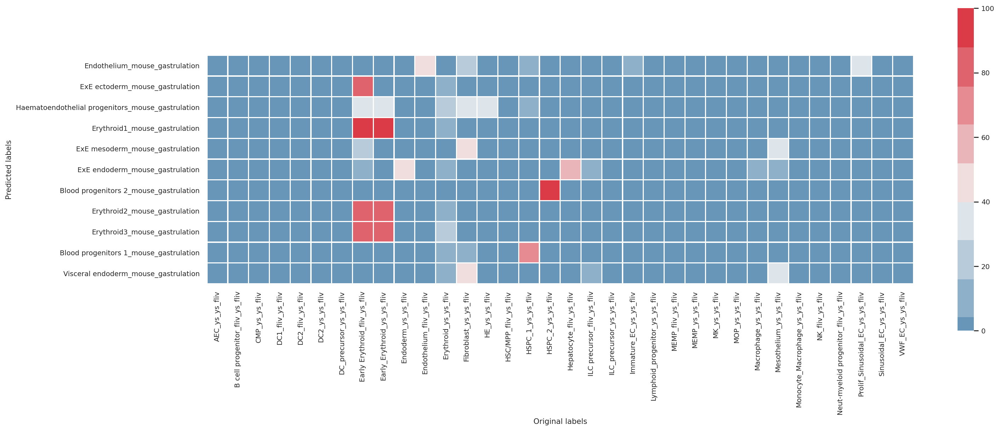

In [21]:
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0, vmax=100, linewidths=1, center=40, square=True, cbar_kws={"shrink": 0.5})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")
plt.savefig(save_path + "/LR_predictions.pdf")
crs_tbl = crs_tbl.T
crs_tbl.to_csv(save_path + "/pre-freq_LR_predictions_supp_table.csv")

- remove endothelial cells from mouse
- Remove all but progen, fibro and hepa from fliv
- Keep only ys populations: progen, endoderm and fibros from YS

In [ ]:
crs_tbl = pd.read_csv('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_090321_notebooks/YS_Reprocess_250721_updates/endo_LR_BM/including_endo_lr/no_endo_pre-freq_LR_predictions_supp_table.csv',index_col=0)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,15))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.5})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")
plt.savefig(save_path + "/LR_predictions.pdf")
crs_tbl.to_csv(save_path + "/pre-freq_LR_predictions_supp_table.csv")

In [13]:
group1 = (adata.obs[common_cat][adata.obs[common_cat].str.contains(Data1_group)]).unique()

### Proportion of cells per group

In [ ]:
prop = adata.obs.groupby('predicted').count()
prop['percentage'] = (prop.iloc[:,6]/prop.iloc[:,6].sum())*100
prop = prop['percentage']
prop.to_csv(save_path + "/pre-freq_predicted_prop.csv")
prop

## Modules to compute Leiden-LR Consensus

## Clustering 

In [ ]:
# Optional clustering 
res = 5
key_add = 'leiden'
adata.obs[key_add] = "nan"
sc.tl.leiden(adata, resolution= res, key_added= key_add, random_state=26, n_iterations=-1)

In [ ]:
cluster_prediction = "clus_prediction"
clusters_reassign = "leiden"
lr_predicted_col = 'predicted'

In [ ]:

adata.obs[cluster_prediction] = adata.obs.index
for z in adata.obs[clusters_reassign].unique():
    df = adata.obs
    df = df[(df[clusters_reassign].isin([z]))]
    df_count = pd.DataFrame(df[lr_predicted_col].value_counts())
    freq_arranged = df_count.index
    cat = freq_arranged[0]
    df.loc[:,cluster_prediction] = cat
    adata.obs.loc[adata.obs[clusters_reassign] == z, [cluster_prediction]] = cat

### Heatmap showing cells in predicted clusters

In [ ]:
# Create a concat col for old + predicted annots
adata.obs['annot_clus_prediction_concat'] = adata.obs[cat1].astype(str) + "_" + adata.obs['clus_prediction'].astype(str)

x='clus_prediction'
y = common_cat

y_attr = adata.obs[y]
x_attr = adata.obs[x]
crs = pd.crosstab(x_attr, y_attr)
crs_tbl = crs
for col in crs_tbl :
    crs_tbl[col] = crs_tbl[col].div(crs_tbl[col].sum(axis=0)).multiply(100).round(2)

#plot_df_heatmap(crs_tbl, cmap='coolwarm', rotation=90, vmin=20, vmax=70)
pal = sns.diverging_palette(240, 10, n=10)
plt.figure(figsize=(20,10))
sns.set(font_scale=0.8)
g = sns.heatmap(crs_tbl, cmap=pal, vmin=0, vmax=100, linewidths=1, center=50, square=True, cbar_kws={"shrink": 0.3})
plt.xlabel("Original labels")
plt.ylabel("Predicted labels")
plt.savefig(save_path + "/LR_predictions_consensus.pdf")
crs_tbl.to_csv(save_path + "/post-freq_LR_predictions_consensus_supp_table.csv")

In [ ]:
prop = adata.obs.groupby('clus_prediction').count()
prop['percentage'] = prop.iloc[:,6]/prop.iloc[:,6].sum()
prop = prop['percentage']
prop.to_csv(save_path + "/post-freq_predicted_leiden_consensus_prop.csv")
prop

In [ ]:
# Generate a umap to view your current data
sc.tl.umap(adata)

def generate_colors(col_required):
    import random
    number_of_colors = col_required
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)])
                 for i in range(number_of_colors)]
    return list(color)

col = generate_colors(len(adata.obs["predicted"].unique()))
sc.pl.umap(adata, color='predicted', palette = col, save = "prediction_umap.pdf")

col = generate_colors(len(adata.obs["clus_prediction"].unique()))
sc.pl.umap(adata, color='clus_prediction', palette = col, save = "clus_prediction_umap.pdf")

In [ ]:
# Are any celltypes removed between prediction and cluster consensus step?
prediction_set = list(adata.obs['predicted'].unique())
clust_prediction_set = list(adata.obs['clus_prediction'].unique())
non_intersect = set(prediction_set) ^ set(clust_prediction_set)
non_intersect = non_intersect.intersection(prediction_set)

if (len(non_intersect)>0):
    print(str(len(non_intersect)) + " labels were omitted during the consensus redistribution step! Please check if these labels are expected to be significantly available in the prediction dataset! Missin labels are::" )
    print("################################")
    print(non_intersect)
    
    # plot umap coloring only labels that were lost in consensus step
    sc.pl.umap(adata,color="predicted",groups=non_intersect, save = "freq_redistribution_omitted_labels_umap.pdf")
else: print("No labels were omitted!")

In [ ]:

# calculate Rand and MI
rand = sklearn.metrics.adjusted_rand_score(list(adata.obs['predicted']), list(adata.obs['clus_prediction']))
mi = sklearn.metrics.adjusted_mutual_info_score(list(adata.obs['predicted']), list(adata.obs['clus_prediction']), 
                                                average_method='arithmetic')

# test concordance between the predicted labels by cell and the consensus clusters
if ((rand<0.8) | (mi<0.8)):
    print("Your concordance between predicted and consensus leiden labels are weak, please attempt reclustering at higher resolution and running consensus again")
    print("Adj Rand extimate = " + str(rand) + "  " + "Mutual Information score=" + str(mi))
else: 
    print("success")
    print("You have achieved good consensus between predicted labels and consensus leiden labels")
    print("Adj Rand extimate = " + str(rand) + "  " + "Mutual Information score=" + str(mi))

In [ ]:
# Note: if low could be due to removed celltypes or may be expected if the cells are quite different such as from different organs, 
# plot cells to check groups and see if group together nicely or all over 

# Save dataframe with new labels 

In [ ]:
df = adata.obs[["predicted", "leiden", "clus_prediction"]]
df = df.rename(columns={"predicted": "pre_freq_clus_prediction", "clus_prediction": "post_freq_clus_prediction"})
df.to_csv(save_path + "/final_lr_metadata_for_adata2.csv")
df